!pip install imutils

In [1]:
!pip install imutils

  Preparing metadata (setup.py) ... done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25837 sha256=a6f755c656ff1598c68c8937105171f3b0516ad7359fc615fa4fa7ab2729091f
  Stored in directory: /root/.cache/pip/wheels/85/cf/3a/e265e975a1e7c7e54eb3692d6aa4e2e7d6a3945d29da46f2d7
Successfully built imutils


In [ ]:
# import system libs
import os
import time
import shutil
import pathlib
import itertools
from PIL import Image

# import data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers
# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")




print ('modules loaded')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
# import shutil
# import os

# # Set the paths for the source and destination folders
# source_folder = '/kaggle/input/vehicle-images-dataset'
# destination_folder = '/kaggle/working/train/vehicles'

# # Check if the destination folder exists, create it if not
# if not os.path.exists(destination_folder):
#     os.makedirs(destination_folder)

# # List all items in the source directory
# items = os.listdir(source_folder)

# # Copy each folder (and its contents) from the source to the destination folder
# for item in items:
#     source_path = os.path.join(source_folder, item)
#     destination_path = os.path.join(destination_folder, item)
#     if os.path.isdir(source_path):
#         shutil.copytree(source_path, destination_path)
#     else:
#         shutil.copy(source_path, destination_path)

# print("Folders and files copied successfully.")


In [4]:
# import shutil
# import os

# # Set the paths for the source and destination folders
# source_folder = '/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/train'
# destination_folder = '/kaggle/working/stanford/train'

# # Check if the destination folder exists, create it if not
# if not os.path.exists(destination_folder):
#     os.makedirs(destination_folder)

# # List all items in the source directory
# items = os.listdir(source_folder)

# # Copy each folder (and its contents) from the source to the destination folder
# for item in items:
#     source_path = os.path.join(source_folder, item)
#     destination_path = os.path.join(destination_folder, item)
#     if os.path.isdir(source_path):
#         shutil.copytree(source_path, destination_path)
#     else:
#         shutil.copy(source_path, destination_path)

# print("Folders and files copied successfully.")


In [5]:
# print(items)



In [6]:
# len(items)

In [7]:
import os
import shutil

# Define the source root directory (train folder)
source_root_dir = '/kaggle/input/vehicle-final/all_vehicle/test'

# Define the destination root directory
destination_root_dir = '/kaggle/working/test'


# Iterate over each class folder (e.g., car, bus)
for class_folder in os.listdir(source_root_dir):
    class_folder_path = os.path.join(source_root_dir, class_folder)
    
    # Check if it's a directory
    if os.path.isdir(class_folder_path):
        image_folder_path = os.path.join(class_folder_path, 'images')
        destination_class_folder_path = os.path.join(destination_root_dir, class_folder)
        
        # Create the destination class folder if it doesn't exist
        if not os.path.exists(destination_class_folder_path):
            os.makedirs(destination_class_folder_path)
        
        # Iterate over each image in the image folder
        for image_name in os.listdir(image_folder_path):
            image_path = os.path.join(image_folder_path, image_name)
            
            # Copy image to the destination class folder
            shutil.copy(image_path, os.path.join(destination_class_folder_path, image_name))
        
        print(f'Copied images to {destination_class_folder_path}')

print("All images have been copied to the destination folders.")

Copied images to /kaggle/working/test/1_Bus
Copied images to /kaggle/working/test/4_Van
Copied images to /kaggle/working/test/0_Car
Copied images to /kaggle/working/test/10_Toto
Copied images to /kaggle/working/test/8_Truck
Copied images to /kaggle/working/test/2_Bicycle
Copied images to /kaggle/working/test/9_Autorickshaw
Copied images to /kaggle/working/test/6_Rickshaw
Copied images to /kaggle/working/test/11_MiniTruck
Copied images to /kaggle/working/test/7_Motorvan
Copied images to /kaggle/working/test/5_Motorized2wheeler
Copied images to /kaggle/working/test/3_Ambassador
All images have been copied to the destination folders.


In [8]:
import os
import shutil

# Define the source root directory (train folder)
source_root_dir = '/kaggle/input/vehicle-final/all_vehicle/train'

# Define the destination root directory
destination_root_dir = '/kaggle/working/train'


# Iterate over each class folder (e.g., car, bus)
for class_folder in os.listdir(source_root_dir):
    class_folder_path = os.path.join(source_root_dir, class_folder)
    
    # Check if it's a directory
    if os.path.isdir(class_folder_path):
        image_folder_path = os.path.join(class_folder_path, 'images')
        destination_class_folder_path = os.path.join(destination_root_dir, class_folder)
        
        # Create the destination class folder if it doesn't exist
        if not os.path.exists(destination_class_folder_path):
            os.makedirs(destination_class_folder_path)
        
        # Iterate over each image in the image folder
        for image_name in os.listdir(image_folder_path):
            image_path = os.path.join(image_folder_path, image_name)
            
            # Copy image to the destination class folder
            shutil.copy(image_path, os.path.join(destination_class_folder_path, image_name))
        
        print(f'Copied images to {destination_class_folder_path}')

print("All images have been copied to the destination folders.")

Copied images to /kaggle/working/train/1_Bus
Copied images to /kaggle/working/train/4_Van
Copied images to /kaggle/working/train/0_Car
Copied images to /kaggle/working/train/10_Toto
Copied images to /kaggle/working/train/8_Truck
Copied images to /kaggle/working/train/2_Bicycle
Copied images to /kaggle/working/train/9_Autorickshaw
Copied images to /kaggle/working/train/6_Rickshaw
Copied images to /kaggle/working/train/11_MiniTruck
Copied images to /kaggle/working/train/7_Motorvan
Copied images to /kaggle/working/train/5_Motorized2wheeler
Copied images to /kaggle/working/train/3_Ambassador
All images have been copied to the destination folders.


In [6]:
# import shutil
# import os

# # Set the paths for the source and destination folders
# source_folder = '/kaggle/input/check-news-224/org_all_image_224_dev/org_all_image_224_dev'
# destination_folder = '/kaggle/working/news/train_all'

# # Check if the destination folder exists, create it if not
# if not os.path.exists(destination_folder):
#     os.makedirs(destination_folder)

# # List all items in the source directory
# items = os.listdir(source_folder)

# # Copy each folder (and its contents) from the source to the destination folder
# for item in items:
#     source_path = os.path.join(source_folder, item)
#     destination_path = os.path.join(destination_folder, item)
    
#     if os.path.isdir(source_path):
#         # If the destination directory already exists, merge the folders
#         if os.path.exists(destination_path):
#             # Merge folders: recursively copy contents from source to destination
#             for sub_item in os.listdir(source_path):
#                 src_sub_path = os.path.join(source_path, sub_item)
#                 dst_sub_path = os.path.join(destination_path, sub_item)
#                 if os.path.isdir(src_sub_path):
#                     if not os.path.exists(dst_sub_path):
#                         os.makedirs(dst_sub_path)
#                     # Recursive call to copy contents
#                     for sub_sub_item in os.listdir(src_sub_path):
#                         shutil.copy2(os.path.join(src_sub_path, sub_sub_item), dst_sub_path)
#                 else:
#                     shutil.copy2(src_sub_path, dst_sub_path)
#         else:
#             # Copy the entire directory if it does not exist
#             shutil.copytree(source_path, destination_path)
#     else:
#         # Copy files directly, overwriting if they exist
#         shutil.copy2(source_path, destination_path)

# print("Folders and files copied successfully.")


In [7]:
# import shutil
# import os

# # Set the paths for the source and destination folders
# source_folder = '/kaggle/input/check-news-224/org_all_image_224_dev/org_all_image_224_dev'
# destination_folder = '/kaggle/working/news/dev'

# # Check if the destination folder exists, create it if not
# if not os.path.exists(destination_folder):
#     os.makedirs(destination_folder)

# # List all items in the source directory
# items = os.listdir(source_folder)

# # Copy each folder (and its contents) from the source to the destination folder
# for item in items:
#     source_path = os.path.join(source_folder, item)
#     destination_path = os.path.join(destination_folder, item)
#     if os.path.isdir(source_path):
#         shutil.copytree(source_path, destination_path)
#     else:
#         shutil.copy(source_path, destination_path)

# print("Folders and files copied successfully.")


In [8]:
# import shutil
# import os

# # Set the paths for the source and destination folders
# source_folder = '/kaggle/input/stanford-car-dataset-by-classes-folder/car_data/car_data/test'
# destination_folder = '/kaggle/working/stanford/test'

# # Check if the destination folder exists, create it if not
# if not os.path.exists(destination_folder):
#     os.makedirs(destination_folder)

# # List all items in the source directory
# items = os.listdir(source_folder)

# # Copy each folder (and its contents) from the source to the destination folder
# for item in items:
#     source_path = os.path.join(source_folder, item)
#     destination_path = os.path.join(destination_folder, item)
#     if os.path.isdir(source_path):
#         shutil.copytree(source_path, destination_path)
#     else:
#         shutil.copy(source_path, destination_path)

# print("Folders and files copied successfully.")


In [9]:
# import os
# import shutil
# import random

# # Set the paths for the source and destination folders
# source_folder = '/kaggle/input/vehicle-images-dataset'
# destination_folder = '/kaggle/working/train/vehicles'
# test_folder = '/kaggle/working/test/vehicles'

# # Check if the destination and test folders exist, create them if not
# if not os.path.exists(destination_folder):
#     os.makedirs(destination_folder)
# if not os.path.exists(test_folder):
#     os.makedirs(test_folder)

# # List all subfolders in the source directory
# subfolders = [f for f in os.listdir(source_folder) if os.path.isdir(os.path.join(source_folder, f))]

# # Copy each subfolder (and its contents) from the source to the destination folder
# for subfolder in subfolders:
#     source_path = os.path.join(source_folder, subfolder)
#     destination_path = os.path.join(destination_folder, subfolder)
#     if not os.path.exists(destination_path):
#         shutil.copytree(source_path, destination_path)
#     else:
#         for item in os.listdir(source_path):
#             shutil.copy(os.path.join(source_path, item), os.path.join(destination_path, item))

# # Move 20% of the data from each subfolder in the destination folder to the test folder
# for subfolder in subfolders:
#     dest_subfolder_path = os.path.join(destination_folder, subfolder)
#     test_subfolder_path = os.path.join(test_folder, subfolder)
    
#     # Create test subfolder if it does not exist
#     if not os.path.exists(test_subfolder_path):
#         os.makedirs(test_subfolder_path)
    
#     # List all items in the current destination subfolder
#     items = os.listdir(dest_subfolder_path)
    
#     # Shuffle items to ensure random selection
#     random.shuffle(items)
    
#     # Calculate the number of items to move (20% of the total)
#     num_items_to_move = int(len(items) * 0.2)
    
#     # Move 20% of the items to the test subfolder
#     for item in items[:num_items_to_move]:
#         source_item_path = os.path.join(dest_subfolder_path, item)
#         destination_test_item_path = os.path.join(test_subfolder_path, item)
#         shutil.move(source_item_path, destination_test_item_path)

# print("Folders and files copied and moved successfully.")


In [3]:
folder_path = '/kaggle/working/test/1_Bus'  # Replace this with your folder path
file_count = sum([len(files) for _, _, files in os.walk(folder_path)])
file_count

240

In [4]:
# folder_path = '/kaggle/working/stanford/train/Suzuki SX4 Sedan 2012'  # Replace this with your folder path
# file_count = sum([len(files) for _, _, files in os.walk(folder_path)])
# file_count

In [5]:
# folder_name = 'crystal_processed'
# colab_path='/kaggle/working/'
# colab_folder_path = f'{colab_path}/{folder_name}'
# if not os.path.exists(colab_folder_path):
#     os.makedirs(colab_folder_path)
#     print(f'Folder "{folder_name}" created.')
    
# folder_name = 'Training'
# colab_path='/kaggle/working/crystal_processed/'
# colab_folder_path = f'{colab_path}/{folder_name}'
# if not os.path.exists(colab_folder_path):
#     os.makedirs(colab_folder_path)
#     print(f'Folder "{folder_name}" created.')
    
# folder_name = 'Testing'
# colab_path='/kaggle/working/crystal_processed/'
# colab_folder_path = f'{colab_path}/{folder_name}'
# if not os.path.exists(colab_folder_path):
#     os.makedirs(colab_folder_path)
#     print(f'Folder "{folder_name}" created.')

In [ ]:
# import numpy as np 
# from tqdm import tqdm
# import cv2
# import os
# import imutils


# def crop_img(img):
#     """
#     Finds the extreme points on the image and crops the rectangular out of them
#     """
# #     gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# #     gray = cv2.GaussianBlur(gray, (3, 3), 0)

# #     # threshold the image, then perform a series of erosions +
# #     # dilations to remove any small regions of noise
# #     thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
# #     thresh = cv2.erode(thresh, None, iterations=2)
# #     thresh = cv2.dilate(thresh, None, iterations=2)

# #     # find contours in thresholded image, then grab the largest one
# #     cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# #     cnts = imutils.grab_contours(cnts)
# #     c = max(cnts, key=cv2.contourArea)

# #     # find the extreme points
# #     extLeft = tuple(c[c[:, :, 0].argmin()][0])
# #     extRight = tuple(c[c[:, :, 0].argmax()][0])
# #     extTop = tuple(c[c[:, :, 1].argmin()][0])
# #     extBot = tuple(c[c[:, :, 1].argmax()][0])
# #     ADD_PIXELS = 0
# #     new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()
    
#     return img
    
# if __name__ == "__main__":
#     training = "/kaggle/working/crystal/train"
#     testing = "/kaggle/working/crystal/test"
#     training_dir = os.listdir(training)
#     testing_dir = os.listdir(testing)
#     IMG_SIZE = 256

#     for dir in training_dir:
#         save_path = '/kaggle/working/train/vehicles/'+ dir
#         path = os.path.join(training,dir)
#         image_dir = os.listdir(path)
#         for img in image_dir:
# #             print(img)
#             image = cv2.imread(os.path.join(path,img))
#             new_img = crop_img(image)
#             new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
#             if not os.path.exists(save_path):
#                 os.makedirs(save_path)
#             cv2.imwrite(save_path+'/'+img, new_img)
    
#     for dir in testing_dir:
#         save_path = '/kaggle/working/test/vehicles/'+ dir
#         path = os.path.join(testing,dir)
#         image_dir = os.listdir(path)
#         for img in image_dir:
# #             print(img)
#             image = cv2.imread(os.path.join(path,img))
#             new_img = crop_img(image)
#             new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
#             if not os.path.exists(save_path):
#                 os.makedirs(save_path)
#             cv2.imwrite(save_path+'/'+img, new_img)

In [14]:
# # Generate data paths with labels
# train_data_dir = '/kaggle/working/stanford/train'
# filepaths = []
# labels = []

# folds = os.listdir(train_data_dir)
# for fold in folds:
#     foldpath = os.path.join(train_data_dir, fold)
#     filelist = os.listdir(foldpath)
#     for file in filelist:
#         fpath = os.path.join(foldpath, file)
        
#         filepaths.append(fpath)
#         labels.append(fold)

# # Concatenate data paths with labels into one dataframe
# Fseries = pd.Series(filepaths, name= 'filepaths')
# Lseries = pd.Series(labels, name='labels')
# train_df = pd.concat([Fseries, Lseries], axis= 1)
# train_df = train_df.sample(frac=1).reset_index(drop=True)


In [15]:
# import os
# import pandas as pd

# train_data_dir = '/kaggle/working/news/train'
# filepaths = []
# labels = []

# # Iterate through each fold in train_data_dir
# folds = os.listdir(train_data_dir)
# for fold in folds:
#     foldpath = os.path.join(train_data_dir, fold)
    
#     # Assuming the image folder is directly under each fold
#     image_folder_path = os.path.join(foldpath, 'images')  # Change 'image_folder' if the actual folder name is different
#     filelist = os.listdir(image_folder_path)
    
#     # Iterate through each image file in the image folder
#     for file in filelist:
#         fpath = os.path.join(image_folder_path, file)
#         filepaths.append(fpath)
#         labels.append(fold)

# # Concatenate data paths with labels into one dataframe
# Fseries = pd.Series(filepaths, name='filepaths')
# Lseries = pd.Series(labels, name='labels')
# train_df = pd.concat([Fseries, Lseries], axis=1)

# train_df = train_df.sample(frac=1).reset_index(drop=True)



In [16]:
# train_df

In [4]:
# Generate data paths with labels
train_data_dir = '/kaggle/working/train'
filepaths = []
labels = []

folds = os.listdir(train_data_dir)
for fold in folds:
    foldpath = os.path.join(train_data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
train_df = pd.concat([Fseries, Lseries], axis= 1)
train_df = train_df.sample(frac=1).reset_index(drop=True)


In [5]:
# # Generate data paths with labels
# train_data_dir = '/kaggle/working/news/dev'
# filepaths = []
# labels = []

# folds = os.listdir(train_data_dir)
# for fold in folds:
#     foldpath = os.path.join(train_data_dir, fold)
#     filelist = os.listdir(foldpath)
#     for file in filelist:
#         fpath = os.path.join(foldpath, file)
        
#         filepaths.append(fpath)
#         labels.append(fold)

# # Concatenate data paths with labels into one dataframe
# Fseries = pd.Series(filepaths, name= 'filepaths')
# Lseries = pd.Series(labels, name='labels')
# valid_df = pd.concat([Fseries, Lseries], axis= 1)
# valid_df = valid_df.sample(frac=1).reset_index(drop=True)


In [6]:
# test_df

In [5]:
# Generate data paths with labels
train_data_dir = '/kaggle/working/test'
filepaths = []
labels = []

folds = os.listdir(train_data_dir)
for fold in folds:
    foldpath = os.path.join(train_data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
test_df = pd.concat([Fseries, Lseries], axis= 1)
test_df = test_df.sample(frac=1).reset_index(drop=True)


In [6]:
train_df

,filepaths,labels
0,/kaggle/working/train/1_Bus/1 (763).png,1_Bus
1,/kaggle/working/train/4_Van/4 (692).PNG,4_Van
2,/kaggle/working/train/11_MiniTruck/11 (34).png,11_MiniTruck
3,/kaggle/working/train/4_Van/4 (789).JPG,4_Van
4,/kaggle/working/train/6_Rickshaw/6 (740).png,6_Rickshaw
...,...,...
4352,/kaggle/working/train/1_Bus/1 (581).png,1_Bus
4353,/kaggle/working/train/6_Rickshaw/6 (797).JPG,6_Rickshaw
4354,/kaggle/working/train/9_Autorickshaw/9 (586).JPG,9_Autorickshaw
4355,/kaggle/working/train/5_Motorized2wheeler/5 (5...,5_Motorized2wheeler


In [9]:
test_df

,filepaths,labels
0,/kaggle/working/test/5_Motorized2wheeler/5 (12...,5_Motorized2wheeler
1,/kaggle/working/test/3_Ambassador/3 (107).png,3_Ambassador
2,/kaggle/working/test/3_Ambassador/3 (3).png,3_Ambassador
3,/kaggle/working/test/6_Rickshaw/6 (5).png,6_Rickshaw
4,/kaggle/working/test/9_Autorickshaw/9 (119).png,9_Autorickshaw
...,...,...
2050,/kaggle/working/test/6_Rickshaw/6 (21).png,6_Rickshaw
2051,/kaggle/working/test/5_Motorized2wheeler/5 (16...,5_Motorized2wheeler
2052,/kaggle/working/test/3_Ambassador/3 (288).png,3_Ambassador
2053,/kaggle/working/test/1_Bus/1 (14).png,1_Bus


In [7]:
train_df, valid_df = train_test_split(train_df,  train_size= 0.8, shuffle= True, random_state= 123)

In [8]:
valid_df

,filepaths,labels
3548,/kaggle/working/train/4_Van/4 (740).PNG,4_Van
3040,/kaggle/working/train/10_Toto/10 (12).jpg,10_Toto
2756,/kaggle/working/train/4_Van/4 (6).png,4_Van
2374,/kaggle/working/train/1_Bus/1 (731).png,1_Bus
2232,/kaggle/working/train/2_Bicycle/2 (11).png,2_Bicycle
...,...,...
2400,/kaggle/working/train/1_Bus/1 (769).png,1_Bus
3301,/kaggle/working/train/5_Motorized2wheeler/5 (6...,5_Motorized2wheeler
1798,/kaggle/working/train/5_Motorized2wheeler/5 (6...,5_Motorized2wheeler
1409,/kaggle/working/train/9_Autorickshaw/9 (370).PNG,9_Autorickshaw


In [11]:
# import numpy as np
# from tensorflow.keras.preprocessing.image import ImageDataGenerator

# def add_random_noise(image):
#     noise_factor = 0.05  # Adjust this to control noise intensity
#     noise = np.random.randn(*image.shape) * noise_factor
#     image_with_noise = image + noise
#     image_with_noise = np.clip(image_with_noise, 0., 1.)  # Ensure values are in the range [0, 1]
#     return image_with_noise

# batch_size = 16
# img_size = (256, 256)
# channels = 3
# img_shape = (img_size[0], img_size[1], channels)

# # Adding augmentation and noise to the training data generator
# tr_gen = ImageDataGenerator(
#     rotation_range=20,          # Random rotation between 0 and 20 degrees
#     width_shift_range=0.1,      # Horizontal shift by a fraction of the total width
#     height_shift_range=0.2,     # Vertical shift by a fraction of the total height
#     shear_range=0.2,            # Shear transformations
#     fill_mode='nearest',        # Fill pixels outside boundaries with nearest pixels
#     preprocessing_function=add_random_noise  # Add custom noise function
# )

# # Validation and test generators usually don't use augmentation
# va_gen = ImageDataGenerator()
# ts_gen = ImageDataGenerator()

# train_gen = tr_gen.flow_from_dataframe(
#     train_df, x_col='filepaths', y_col='labels', target_size=img_size,
#     class_mode='categorical', color_mode='rgb', shuffle=True, batch_size=batch_size
# )

# valid_gen = va_gen.flow_from_dataframe(
#     valid_df, x_col='filepaths', y_col='labels', target_size=img_size,
#     class_mode='categorical', color_mode='rgb', shuffle=True, batch_size=batch_size
# )

# test_gen = ts_gen.flow_from_dataframe(
#     test_df, x_col='filepaths', y_col='labels', target_size=img_size,
#     class_mode='categorical', color_mode='rgb', shuffle=False, batch_size=batch_size
# )


In [12]:
# import matplotlib.pyplot as plt

# # Get a batch of images and labels from the training generator
# images, labels = next(valid_gen)
# plt.figure(figsize= (20, 20))
# for i in range(16):
#     plt.subplot(4, 4, i + 1)
#     image = images[i] / 255       # scales data to range (0 - 255)
#     plt.imshow(image)
#     index = np.argmax(labels[i])  # get image index
#     class_name = classes[index]   # get class of image
#     plt.title(class_name, color= 'blue', fontsize= 12)
#     plt.axis('off')
# plt.show()


In [9]:
batch_size = 16
img_size = (256, 256)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator()
va_gen=  ImageDataGenerator()
ts_gen = ImageDataGenerator()

train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

valid_gen = va_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

test_gen = ts_gen.flow_from_dataframe( test_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= False, batch_size= batch_size)

Found 3485 validated image filenames belonging to 12 classes.
Found 872 validated image filenames belonging to 12 classes.
Found 2055 validated image filenames belonging to 12 classes.


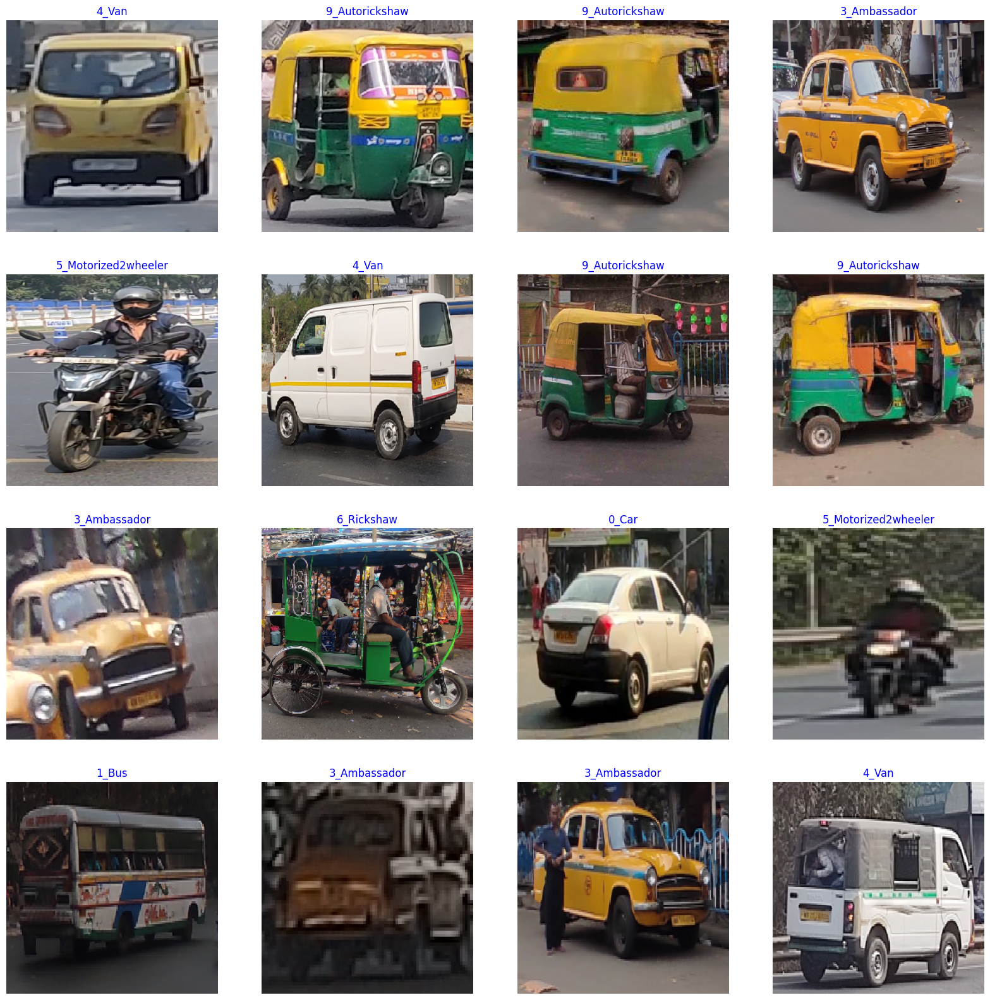

In [10]:
g_dict = train_gen.class_indices      # defines dictionary {'class': index}
classes = list(g_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(train_gen)      # get a batch size samples from the generator

plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255       # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 12)
    plt.axis('off')
plt.show()

In [11]:
# Create Model Structure
img_size = (256, 256)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys())) # to define number of classes in dense layer

epochs = 40

In [12]:
class_count

12

In [13]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [14]:
!pip install tensorflow-model-optimization


  Obtaining dependency information for tensorflow-model-optimization from https://files.pythonhosted.org/packages/5a/a0/f38c9ce977285d3f347f6d64cf227924fe9fc97d780d6df4a55563e311af/tensorflow_model_optimization-0.8.0-py2.py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 6.1 MB/s eta 0:00:00a 0:00:01


In [15]:
# import tensorflow_model_optimization as tfmot
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import regularizers
import tensorflow_addons as tfa

In [64]:
# prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude

# pruning_params = {
#     'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(
#         initial_sparsity=0.0,
#         final_sparsity=0.20,
#         begin_step=0,
#         end_step=np.ceil(len(train_gen) * 40 / train_gen.batch_size).astype(np.int32)
#     )
# }


In [65]:
# base_model = tf.keras.applications.EfficientNetB3(
#     include_top=False,
#     weights="imagenet",
#     input_shape=img_shape,
#     pooling='max'
# )


In [46]:
# save_dir = '/kaggle/working/'
# filepath = os.path.join(save_dir, 'eb3_weight_normal_pruning_20_9.h5')


In [47]:
# from tensorflow_model_optimization.sparsity.keras import UpdatePruningStep, PruningSummaries

# # Define checkpoint callback
# checkpoint_callback = ModelCheckpoint(
#     filepath=filepath,
#     save_best_only=True,
#     monitor='val_loss',
#     mode='min',
#     verbose=1
# )

# # Pruning callbacks
# pruning_callbacks = [
#     UpdatePruningStep(),
#     PruningSummaries(log_dir='/tmp/pruning_logs')
# ]

# # Combine callbacks
# callbacks = [checkpoint_callback] + pruning_callbacks


In [48]:
# model.compile(
#     optimizer=Adamax(learning_rate=0.001),
#     loss='categorical_crossentropy',
#     metrics=['accuracy']
# )
# model.summary()

In [49]:
# with tf.device('/GPU:0'):
#     history = model.fit(
#         x=train_gen,
#         epochs=40,
#         verbose=1,
#         validation_data=valid_gen,
#         shuffle=False,
#         callbacks=callbacks
#     )


In [50]:
# model = tfmot.sparsity.keras.strip_pruning(model)


In [51]:
# model.summary()

# **Model_128_no_prunned_cross_entropy**

In [16]:
from tensorflow.keras.applications import EfficientNetB3, InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, Concatenate
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ModelCheckpoint

In [20]:

base_model = tf.keras.applications.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(128, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'demo.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


43941136/43941136 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization (Batch  (None, 1536)              6144      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 128)               196736    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 12)                1548      
                                                         

In [21]:
import os

# Save the model
model.save('/kaggle/working/blank.h5')

# Check the file size
model_size = os.path.getsize('/kaggle/working/blank.h5') / (1024 * 1024)  # Convert to MB
print(f"Model size: {model_size:.2f} MB")

Model size: 42.59 MB


In [22]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple.h5")
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 12s 87ms/step - loss: 0.2053 - accuracy: 0.9674
--------------------
Validation Loss:  0.06906181573867798
Validation Accuracy:  1.0
--------------------
Test Loss:  0.20532964169979095
Test Accuracy:  0.96739661693573


In [23]:
import numpy as np

def calculate_sparsity(model):
    total_params = 0
    zero_params = 0
    for layer in model.layers:
        weights = layer.get_weights()
        if weights:
            for weight_matrix in weights:
                total_params += np.prod(weight_matrix.shape)
                zero_params += np.sum(weight_matrix == 0)

    sparsity_ratio = zero_params / total_params if total_params > 0 else 0
    print(f"Sparsity: {sparsity_ratio * 100:.2f}% of the weights are zero.")

# Check sparsity in the pruned model
calculate_sparsity(model)

Sparsity: 0.00% of the weights are zero.


In [24]:
import os
best_model_path='/kaggle/working/eb3_20_9_24_simple.h5'
best_model_size = os.path.getsize(best_model_path)


# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)


# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
# For original model
print(f"Number of parameters in the best model: {model.count_params()}")






Size of the best model: 126.42 MB
Number of parameters in the best model: 10987963


In [25]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple.h5")
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.save('/kaggle/working/no_opt.h5', include_optimizer=False)
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])


In [26]:
import os
best_model_path='/kaggle/working/no_opt.h5'
best_model_size = os.path.getsize(best_model_path)


# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)


# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
# For original model
print(f"Number of parameters in the best model: {model.count_params()}")


Size of the best model: 42.58 MB
Number of parameters in the best model: 10987963


In [27]:
import numpy as np

def calculate_sparsity(model):
    total_params = 0
    zero_params = 0
    for layer in model.layers:
        weights = layer.get_weights()
        if weights:
            for weight_matrix in weights:
                total_params += np.prod(weight_matrix.shape)
                zero_params += np.sum(weight_matrix == 0)

    sparsity_ratio = zero_params / total_params if total_params > 0 else 0
    print(f"Sparsity: {sparsity_ratio * 100:.2f}% of the weights are zero.")

# Check sparsity in the pruned model
calculate_sparsity(model)

Sparsity: 0.00% of the weights are zero.


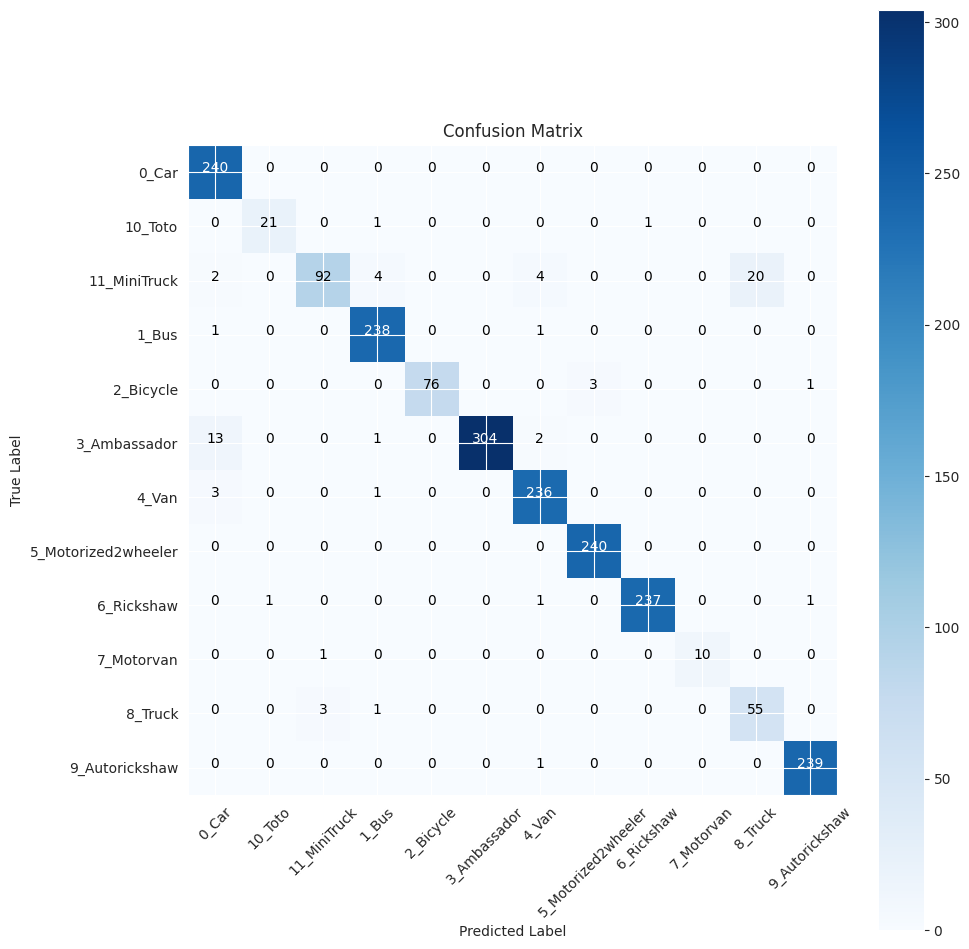

                     precision    recall  f1-score   support

              0_Car       0.93      1.00      0.96       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.96      0.75      0.84       122
              1_Bus       0.97      0.99      0.98       240
          2_Bicycle       1.00      0.95      0.97        80
       3_Ambassador       1.00      0.95      0.97       320
              4_Van       0.96      0.98      0.97       240
5_Motorized2wheeler       0.99      1.00      0.99       240
         6_Rickshaw       1.00      0.99      0.99       240
         7_Motorvan       1.00      0.91      0.95        11
            8_Truck       0.73      0.93      0.82        59
     9_Autorickshaw       0.99      1.00      0.99       240

           accuracy                           0.97      2055
          macro avg       0.96      0.95      0.95      2055
       weighted avg       0.97      0.97      0.97      2055



In [28]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple.h5")
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

# **Model_64_no_prunned_cross_entropy**

In [29]:

base_model = tf.keras.applications.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(64, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'demo.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_1 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 64)                98368     
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [30]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple_64.h5")
# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_1 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 64)                98368     
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [31]:
import os

# Save the model
model.save('/kaggle/working/blank_64.h5')

# Check the file size
model_size = os.path.getsize('/kaggle/working/blank_64.h5') / (1024 * 1024)  # Convert to MB
print(f"Model size: {model_size:.2f} MB")

Model size: 42.21 MB


In [32]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple_64.h5")
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 12s 84ms/step - loss: 0.2267 - accuracy: 0.9655
--------------------
Validation Loss:  0.0728330984711647
Validation Accuracy:  1.0
--------------------
Test Loss:  0.22666999697685242
Test Accuracy:  0.9654501080513


In [33]:
import numpy as np

def calculate_sparsity(model):
    total_params = 0
    zero_params = 0
    for layer in model.layers:
        weights = layer.get_weights()
        if weights:
            for weight_matrix in weights:
                total_params += np.prod(weight_matrix.shape)
                zero_params += np.sum(weight_matrix == 0)

    sparsity_ratio = zero_params / total_params if total_params > 0 else 0
    print(f"Sparsity: {sparsity_ratio * 100:.2f}% of the weights are zero.")

# Check sparsity in the pruned model
calculate_sparsity(model)

Sparsity: 0.00% of the weights are zero.


In [34]:
import os
best_model_path='/kaggle/working/eb3_20_9_24_simple_64.h5'
best_model_size = os.path.getsize(best_model_path)


# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)


# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
# For original model
print(f"Number of parameters in the best model: {model.count_params()}")




Size of the best model: 125.28 MB
Number of parameters in the best model: 10888827


In [35]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple_64.h5")
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.save('/kaggle/working/no_opt_64.h5', include_optimizer=False)
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])


In [36]:
import os
best_model_path='/kaggle/working/no_opt_64.h5'
best_model_size = os.path.getsize(best_model_path)


# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)


# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
# For original model
print(f"Number of parameters in the best model: {model.count_params()}")


Size of the best model: 42.21 MB
Number of parameters in the best model: 10888827


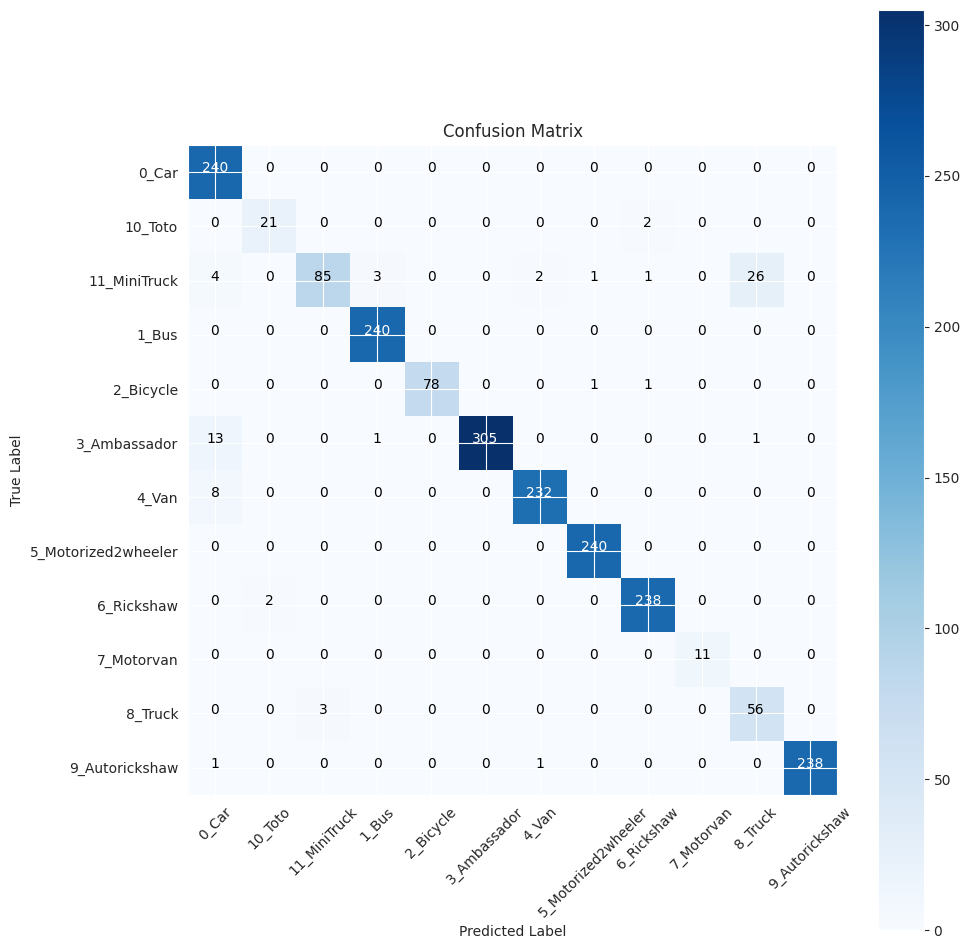

                     precision    recall  f1-score   support

              0_Car       0.90      1.00      0.95       240
            10_Toto       0.91      0.91      0.91        23
       11_MiniTruck       0.97      0.70      0.81       122
              1_Bus       0.98      1.00      0.99       240
          2_Bicycle       1.00      0.97      0.99        80
       3_Ambassador       1.00      0.95      0.98       320
              4_Van       0.99      0.97      0.98       240
5_Motorized2wheeler       0.99      1.00      1.00       240
         6_Rickshaw       0.98      0.99      0.99       240
         7_Motorvan       1.00      1.00      1.00        11
            8_Truck       0.67      0.95      0.79        59
     9_Autorickshaw       1.00      0.99      1.00       240

           accuracy                           0.97      2055
          macro avg       0.95      0.95      0.95      2055
       weighted avg       0.97      0.97      0.97      2055



In [37]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple_64.h5")
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

# Focal_Loss

In [17]:
import tensorflow as tf
from tensorflow.keras import backend as K

def focal_loss(gamma=2., alpha=0.25):
    """
    Focal Loss for multiclass classification.
    gamma: focusing parameter (higher gamma focuses more on hard misclassified examples)
    alpha: balancing factor (for class imbalance)
    """
    def focal_loss_fixed(y_true, y_pred):
        # Convert labels to float32 for numerical stability
        y_true = tf.cast(y_true, tf.float32)
        
        # Clip prediction values to prevent log(0) errors
        epsilon = K.epsilon()
        y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
        
        # Cross-entropy loss
        cross_entropy = -y_true * K.log(y_pred)
        
        # Focal loss scaling factor
        weight = alpha * K.pow(1 - y_pred, gamma)
        
        # Compute the final loss
        loss = weight * cross_entropy
        return K.sum(loss, axis=-1)
    
    return focal_loss_fixed

# Model_128_focal_loss

In [21]:
# Assuming `img_shape` and `class_count` are already defined
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# Build the model
model = Sequential([
    base_model,
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    Dense(128, kernel_regularizer=regularizers.l2(0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu'),
    Dropout(rate=0.15, seed=123),
    Dense(class_count, activation='softmax')  # Softmax for multiclass classification
])

# Compile the model with the custom focal loss for multiclass classification
# model.compile(
#     optimizer=Adamax(learning_rate=0.001), 
#     loss=focal_loss(gamma=2., alpha=0.25),  # Apply custom focal loss
#     metrics=['accuracy']
# )

model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)
# Model summary
model.summary()


43941136/43941136 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization (Batch  (None, 1536)              6144      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 128)               196736    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 12)                1548      
                                                         

In [21]:
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_record_128.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-23 21:07:38.643954: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 2.4875 - accuracy: 0.8235
Epoch 1: val_loss improved from inf to 1.28957, saving model to /kaggle/working/eb3_record_128.h5
218/218 [==============================] - 129s 324ms/step - loss: 2.4875 - accuracy: 0.8235 - val_loss: 1.2896 - val_accuracy: 0.9404
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 0.7946 - accuracy: 0.9466
Epoch 2: val_loss improved from 1.28957 to 0.44287, saving model to /kaggle/working/eb3_record_128.h5
218/218 [==============================] - 67s 306ms/step - loss: 0.7946 - accuracy: 0.9466 - val_loss: 0.4429 - val_accuracy: 0.9633
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 0.3004 - accuracy: 0.9676
Epoch 3: val_loss improved from 0.44287 to 0.18608, saving model to /kaggle/working/eb3_record_128.h5
218/218 [==============================] - 67s 307ms/step - loss: 0.3004 - accuracy: 0.9676 - val_loss: 0.1861 - val_accuracy: 0.9771
Epoch 4/40
218/218

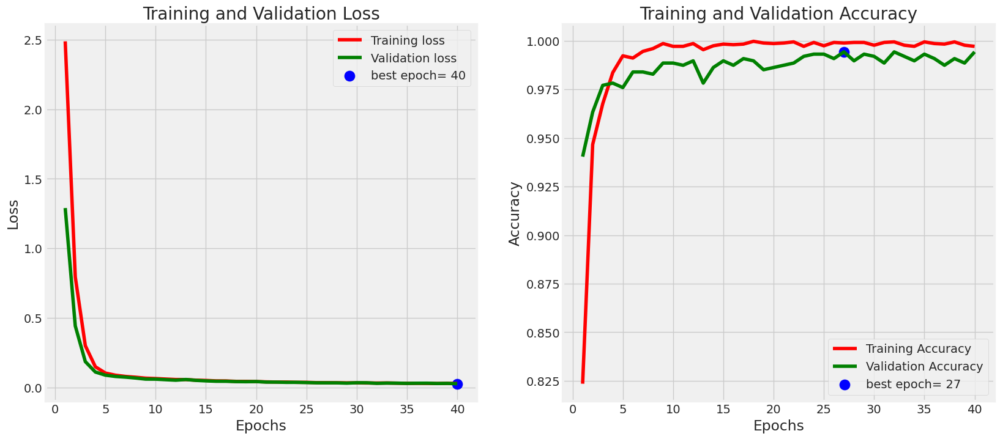

In [22]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [23]:
train_df['labels'].value_counts()

labels
5_Motorized2wheeler    455
9_Autorickshaw         454
6_Rickshaw             453
0_Car                  452
4_Van                  449
1_Bus                  434
3_Ambassador           376
11_MiniTruck           142
8_Truck                120
2_Bicycle               93
10_Toto                 31
7_Motorvan              26
Name: count, dtype: int64

In [24]:
valid_df['labels'].value_counts()

labels
1_Bus                  126
4_Van                  111
9_Autorickshaw         110
6_Rickshaw             108
0_Car                  108
5_Motorized2wheeler    105
3_Ambassador           104
11_MiniTruck            41
2_Bicycle               27
8_Truck                 20
7_Motorvan               7
10_Toto                  5
Name: count, dtype: int64

In [25]:
test_df['labels'].value_counts()

labels
3_Ambassador           320
0_Car                  240
1_Bus                  240
4_Van                  240
9_Autorickshaw         240
5_Motorized2wheeler    240
6_Rickshaw             240
11_MiniTruck           122
2_Bicycle               80
8_Truck                 59
10_Toto                 23
7_Motorvan              11
Name: count, dtype: int64

In [22]:
model.load_weights("/kaggle/working/eb3_20_9_24_new.h5")
model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 14s 103ms/step - loss: 0.0380 - accuracy: 0.9713
--------------------
Validation Loss:  0.025364700704813004
Validation Accuracy:  0.9965596199035645
--------------------
Test Loss:  0.03796854987740517
Test Accuracy:  0.9712895154953003


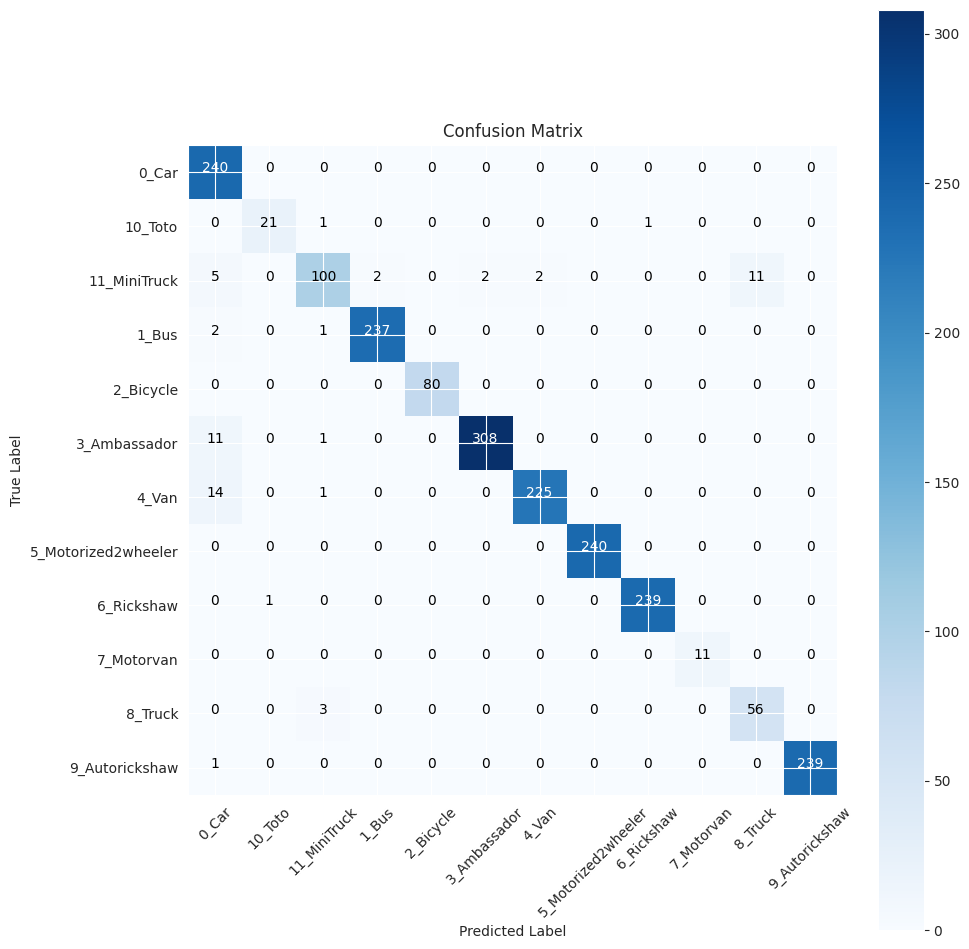

                     precision    recall  f1-score   support

              0_Car       0.88      1.00      0.94       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.93      0.82      0.87       122
              1_Bus       0.99      0.99      0.99       240
          2_Bicycle       1.00      1.00      1.00        80
       3_Ambassador       0.99      0.96      0.98       320
              4_Van       0.99      0.94      0.96       240
5_Motorized2wheeler       1.00      1.00      1.00       240
         6_Rickshaw       1.00      1.00      1.00       240
         7_Motorvan       1.00      1.00      1.00        11
            8_Truck       0.84      0.95      0.89        59
     9_Autorickshaw       1.00      1.00      1.00       240

           accuracy                           0.97      2055
          macro avg       0.96      0.96      0.96      2055
       weighted avg       0.97      0.97      0.97      2055



In [24]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

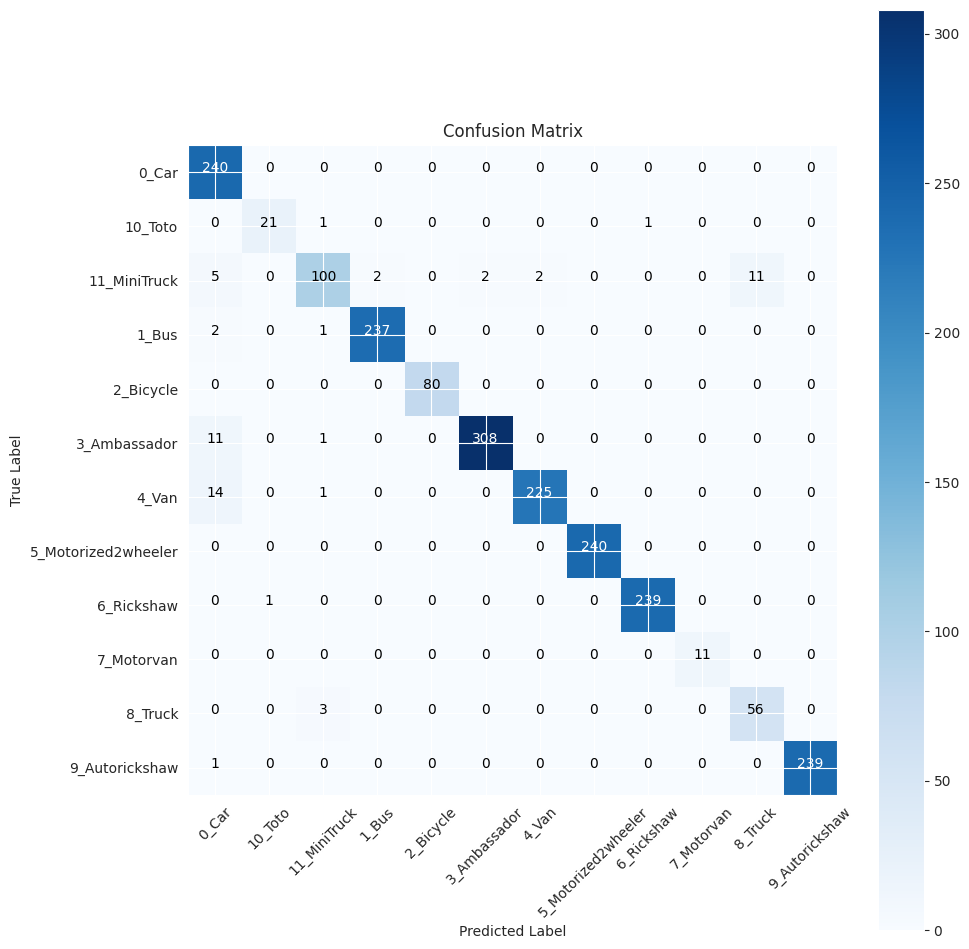

                     precision    recall  f1-score   support

              0_Car       0.88      1.00      0.94       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.93      0.82      0.87       122
              1_Bus       0.99      0.99      0.99       240
          2_Bicycle       1.00      1.00      1.00        80
       3_Ambassador       0.99      0.96      0.98       320
              4_Van       0.99      0.94      0.96       240
5_Motorized2wheeler       1.00      1.00      1.00       240
         6_Rickshaw       1.00      1.00      1.00       240
         7_Motorvan       1.00      1.00      1.00        11
            8_Truck       0.84      0.95      0.89        59
     9_Autorickshaw       1.00      1.00      1.00       240

           accuracy                           0.97      2055
          macro avg       0.96      0.96      0.96      2055
       weighted avg       0.97      0.97      0.97      2055

Accuracy: 0.9713
Prec

In [25]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Prediction and Confusion Matrix Plotting (as you already have)
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion Matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize=(10, 10))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment='center', color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

# Classification report
print(classification_report(test_gen.classes, y_pred, target_names=classes))

# Accuracy, Precision, Recall, F1 Score
accuracy = accuracy_score(test_gen.classes, y_pred)
precision = precision_score(test_gen.classes, y_pred, average='weighted')
recall = recall_score(test_gen.classes, y_pred, average='weighted')
f1 = f1_score(test_gen.classes, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (weighted): {precision:.4f}")
print(f"Recall (weighted): {recall:.4f}")
print(f"F1 Score (weighted): {f1:.4f}")


# Model_64_focal_loss

In [41]:
# Assuming `img_shape` and `class_count` are already defined
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# Build the model
model = Sequential([
    base_model,
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    Dense(64, kernel_regularizer=regularizers.l2(0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu'),
    Dropout(rate=0.15, seed=123),
    Dense(class_count, activation='softmax')  # Softmax for multiclass classification
])

# Compile the model with the custom focal loss for multiclass classification
# model.compile(
#     optimizer=Adamax(learning_rate=0.001), 
#     loss=focal_loss(gamma=2., alpha=0.25),  # Apply custom focal loss
#     metrics=['accuracy']
# )

model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)
# Model summary
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_3 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_6 (Dense)             (None, 64)                98368     
                                                                 
 dropout_3 (Dropout)         (None, 64)                0         
                                                                 
 dense_7 (Dense)             (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [42]:
model.load_weights("/kaggle/working/eb3_20_9_24_new__focal_64.h5")
model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 12s 86ms/step - loss: 0.0442 - accuracy: 0.9504
--------------------
Validation Loss:  0.027052603662014008
Validation Accuracy:  0.9965596199035645
--------------------
Test Loss:  0.04418346658349037
Test Accuracy:  0.9503649473190308


In [29]:
!pip install tensorflow-model-optimization


  Obtaining dependency information for tensorflow-model-optimization from https://files.pythonhosted.org/packages/5a/a0/f38c9ce977285d3f347f6d64cf227924fe9fc97d780d6df4a55563e311af/tensorflow_model_optimization-0.8.0-py2.py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 4.0 MB/s eta 0:00:00a 0:00:01


# Focal_Loss_prunned

# **128_prunned**

In [19]:
import tensorflow_model_optimization as tfmot
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint
import os

# Pruning configuration
pruning_params = {
    'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(
        initial_sparsity=0.30,  # Start pruning after 30% sparsity
        final_sparsity=0.80,    # End pruning at 80% sparsity
        begin_step=0,           # Start pruning at step 0
        end_step=2000           # End pruning after this many steps
    )
}

# Load the best pre-trained model from the checkpoint

# _shape` and `class_count` are already defined
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# Build the model
best_model = Sequential([
    base_model,
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    Dense(128, kernel_regularizer=regularizers.l2(0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu'),
    Dropout(rate=0.15, seed=123),
    Dense(class_count, activation='softmax')  # Softmax for multiclass classification
])

# Compile the model with the custom focal loss for multiclass classification
# model.compile(
#     optimizer=Adamax(learning_rate=0.001), 
#     loss=focal_loss(gamma=2., alpha=0.25),  # Apply custom focal loss
#     metrics=['accuracy']
# )
# best_model = '/kaggle/working/eb3_20_9_24_new.h5'
best_model.load_weights("/kaggle/working/eb3_20_9_24_new.h5")
best_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)


In [31]:
# Apply pruning to the Dense layers of the loaded model
def apply_pruning_to_model(model):
    # Rebuild the model with pruning applied to the dense layers
    pruned_model = Sequential([
        model.layers[0],  # Retain the EfficientNet base model
        BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
        tfmot.sparsity.keras.prune_low_magnitude(Dense(64,  # Reduced for lightweight model
            kernel_regularizer=regularizers.l2(0.016),
            activity_regularizer=regularizers.l1(0.006),
            bias_regularizer=regularizers.l1(0.006), activation='relu'), **pruning_params),
        Dropout(rate=0.25, seed=123),  # Adjusted dropout
        Dense(class_count, activation='softmax')  # Softmax for multiclass classification
    ])
    return pruned_model

# Apply pruning to the loaded model
pruned_model = apply_pruning_to_model(best_model)

In [ ]:
# Compile the pruned model
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)

In [38]:
# Define pruning callback
pruning_callback = tfmot.sparsity.keras.UpdatePruningStep()
# Fine-tune or train the pruned model (you can skip this if not training further)
with tf.device('/GPU:0'):
    pruned_history = pruned_model.fit(
        x=train_gen,
        epochs=10,  # Fine-tune for a few epochs to adjust after pruning
        verbose=1,
        validation_data=valid_gen,
        shuffle=False,
        callbacks=[pruning_callback]
    )

# Strip pruning wrappers for final model export
final_pruned_model = tfmot.sparsity.keras.strip_pruning(pruned_model)

# Save the pruned model
save_dir = '/kaggle/working/'
pruned_model_path = os.path.join(save_dir, 'eb3_pruned_final_check.h5')
final_pruned_model.save(pruned_model_path)
print(f"Pruned model saved at: {pruned_model_path}")


Epoch 1/10


2024-09-23 22:15:12.064478: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_7/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - 124s 310ms/step - loss: 1.1362 - accuracy: 0.9727 - val_loss: 0.5847 - val_accuracy: 0.9966
Epoch 2/10
218/218 [==============================] - 65s 298ms/step - loss: 0.3676 - accuracy: 0.9963 - val_loss: 0.2084 - val_accuracy: 0.9954
Epoch 3/10
218/218 [==============================] - 65s 297ms/step - loss: 0.1329 - accuracy: 0.9971 - val_loss: 0.0757 - val_accuracy: 0.9989
Epoch 4/10
218/218 [==============================] - 65s 298ms/step - loss: 0.0508 - accuracy: 0.9986 - val_loss: 0.0295 - val_accuracy: 1.0000
Epoch 5/10
218/218 [==============================] - 65s 299ms/step - loss: 0.0231 - accuracy: 0.9994 - val_loss: 0.0152 - val_accuracy: 0.9989
Epoch 6/10
218/218 [==============================] - 65s 298ms/step - loss: 0.0139 - accuracy: 0.9994 - val_loss: 0.0105 - val_accuracy: 0.9989
Epoch 7/10
218/218 [==============================] - 65s 297ms/step - loss: 0.0110 - accuracy: 0.9991 - val_loss: 0.0092 - val_accuracy: 0.

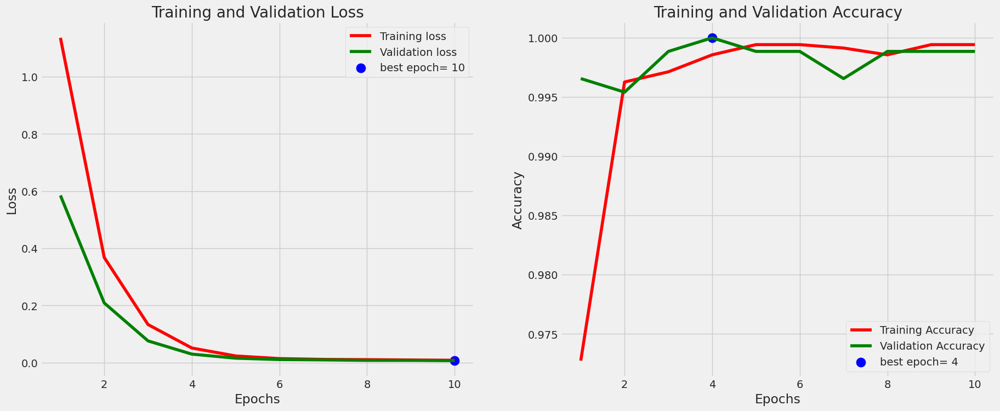

In [40]:
# Define needed variables
tr_acc = pruned_history.history['accuracy']
tr_loss = pruned_history.history['loss']
val_acc = pruned_history.history['val_accuracy']
val_loss = pruned_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [20]:
pruned_model_path='/kaggle/working/eb3_pruned_final_check.h5'
pruned_model = load_model(pruned_model_path)

# pruned_model.load_weights('/kaggle/working/eb3_pruned_final_20_9_24_new.h5')

# Compile the pruned model
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)

In [21]:
pruned_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_7 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_14 (Dense)            (None, 64)                98368     
                                                                 
 dropout_7 (Dropout)         (None, 64)                0         
                                                                 
 dense_15 (Dense)            (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [33]:
pruned_model_path='/kaggle/working/eb3_pruned_final_20_9_24_new.h5'
pruned_model = load_model(pruned_model_path)

# pruned_model.load_weights('/kaggle/working/eb3_pruned_final_20_9_24_new.h5')

# Compile the pruned model
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)


In [34]:
pruned_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_6 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_21 (Dense)            (None, 64)                98368     
                                                                 
 dropout_9 (Dropout)         (None, 64)                0         
                                                                 
 dense_22 (Dense)            (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [56]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = pruned_model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = pruned_model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 12s 84ms/step - loss: 0.1055 - accuracy: 0.9737
--------------------
Validation Loss:  0.0959848016500473
Validation Accuracy:  1.0
--------------------
Test Loss:  0.10552480071783066
Test Accuracy:  0.9737226366996765


In [58]:
model_size = os.path.getsize('/kaggle/working/eb3_pruned_final_20_9_24_new.h5') / (1024 * 1024)  # Convert to MB
print(f"Model size: {model_size:.2f} MB")

Model size: 42.21 MB


In [61]:
import numpy as np

def calculate_sparsity(model):
    total_params = 0
    zero_params = 0
    for layer in model.layers:
        weights = layer.get_weights()
        if weights:
            for weight_matrix in weights:
                total_params += np.prod(weight_matrix.shape)
                zero_params += np.sum(weight_matrix == 0)

    sparsity_ratio = zero_params / total_params if total_params > 0 else 0
    print(zero_params,total_params)
    print(f"Sparsity: {sparsity_ratio * 100:.2f}% of the weights are zero.")

# Check sparsity in the pruned model
calculate_sparsity(pruned_model)

78644 10888827.0
Sparsity: 0.72% of the weights are zero.


In [62]:
(78644/10888827)*100

0.7222449213308284

In [68]:
pruned_model.load_weights('/kaggle/working/prunned_64_optimized.h5')
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)
pruned_model.save('/kaggle/working/prunned_64_optimized.h5', include_optimizer=False)
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)
pruned_model_path='/kaggle/working/prunned_64_optimized.h5'
best_model_size = os.path.getsize(pruned_model_path)


# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)


# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
# For original model
print(f"Number of parameters in the best model: {model.count_params()}")


Size of the best model: 42.21 MB
Number of parameters in the best model: 10888827


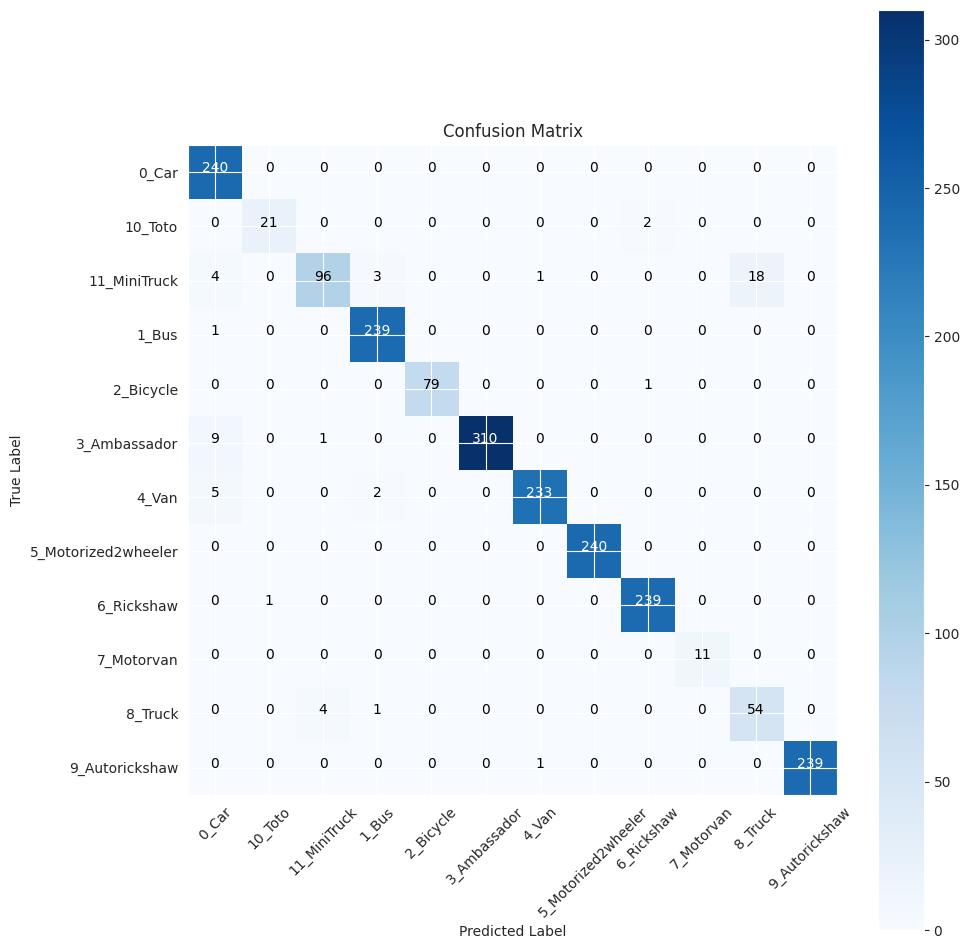

                     precision    recall  f1-score   support

              0_Car       0.93      1.00      0.96       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.95      0.79      0.86       122
              1_Bus       0.98      1.00      0.99       240
          2_Bicycle       1.00      0.99      0.99        80
       3_Ambassador       1.00      0.97      0.98       320
              4_Van       0.99      0.97      0.98       240
5_Motorized2wheeler       1.00      1.00      1.00       240
         6_Rickshaw       0.99      1.00      0.99       240
         7_Motorvan       1.00      1.00      1.00        11
            8_Truck       0.75      0.92      0.82        59
     9_Autorickshaw       1.00      1.00      1.00       240

           accuracy                           0.97      2055
          macro avg       0.96      0.96      0.96      2055
       weighted avg       0.98      0.97      0.97      2055



In [35]:
preds = pruned_model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

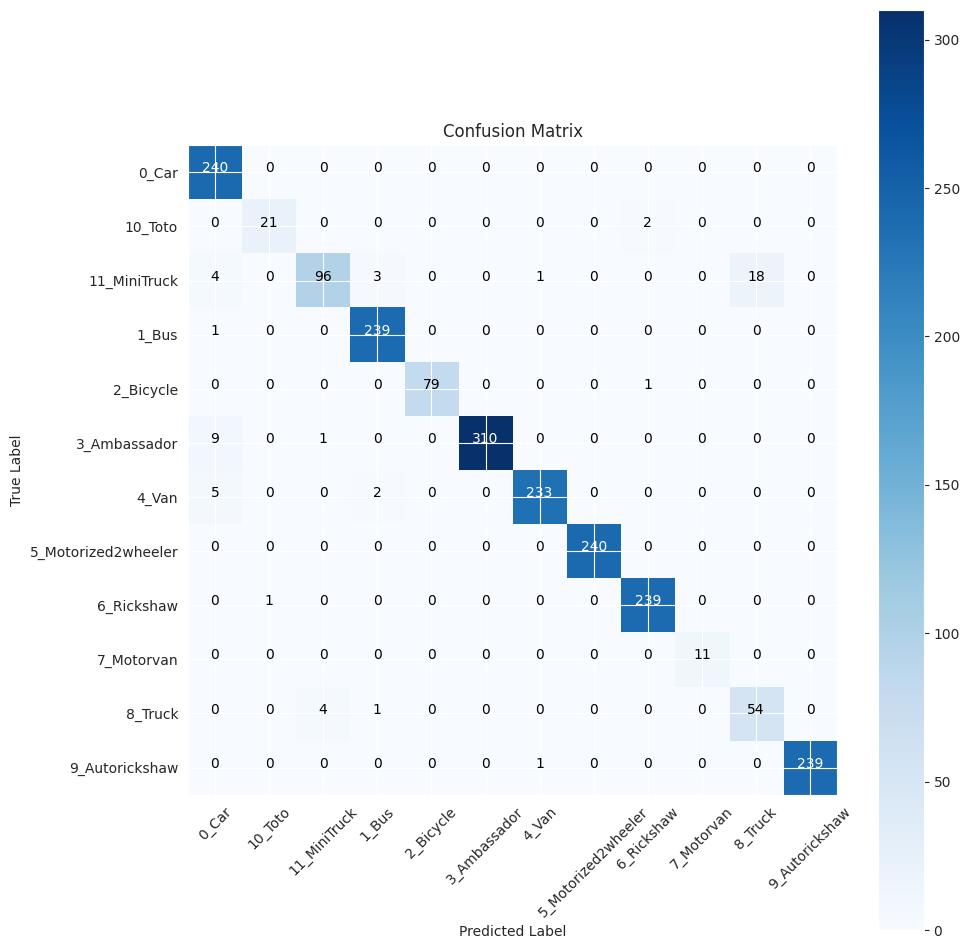

                     precision    recall  f1-score   support

              0_Car       0.93      1.00      0.96       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.95      0.79      0.86       122
              1_Bus       0.98      1.00      0.99       240
          2_Bicycle       1.00      0.99      0.99        80
       3_Ambassador       1.00      0.97      0.98       320
              4_Van       0.99      0.97      0.98       240
5_Motorized2wheeler       1.00      1.00      1.00       240
         6_Rickshaw       0.99      1.00      0.99       240
         7_Motorvan       1.00      1.00      1.00        11
            8_Truck       0.75      0.92      0.82        59
     9_Autorickshaw       1.00      1.00      1.00       240

           accuracy                           0.97      2055
          macro avg       0.96      0.96      0.96      2055
       weighted avg       0.98      0.97      0.97      2055

Accuracy: 0.9737
Prec

In [36]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Prediction and Confusion Matrix Plotting (as you already have)
preds = pruned_model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion Matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize=(10, 10))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment='center', color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

# Classification report
print(classification_report(test_gen.classes, y_pred, target_names=classes))

# Accuracy, Precision, Recall, F1 Score
accuracy = accuracy_score(test_gen.classes, y_pred)
precision = precision_score(test_gen.classes, y_pred, average='weighted')
recall = recall_score(test_gen.classes, y_pred, average='weighted')
f1 = f1_score(test_gen.classes, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (weighted): {precision:.4f}")
print(f"Recall (weighted): {recall:.4f}")
print(f"F1 Score (weighted): {f1:.4f}")


In [63]:
import os


pruned_model_path='/kaggle/working/eb3_pruned_final_20_9_24_new.h5'
best_model_size = os.path.getsize(pruned_model_path)


# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)


# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
# For original model
print(f"Number of parameters in the best model: {model.count_params()}")


Size of the best model: 42.21 MB
Number of parameters in the best model: 10888827


In [72]:
# Pruning configuration
pruning_params = {
    'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(
        initial_sparsity=0.30,  # Start pruning after 30% sparsity
        final_sparsity=0.80,    # End pruning at 80% sparsity
        begin_step=0,           # Start pruning at step 0
        end_step=2000           # End pruning after this many steps
    )
}


In [78]:

# best_model = load_model(best_model_path, custom_objects={'focal_loss': focal_loss})

# Apply pruning to the Dense layers and the base model
def apply_pruning_to_model(model, class_count):
    # Get the base model (e.g., EfficientNet)
    base_model = model.layers[0]  # Assuming the first layer is the base model (EfficientNet)
    
    # Apply pruning to the base model
    pruned_base_model = tfmot.sparsity.keras.prune_low_magnitude(base_model, **pruning_params)
    
    # Rebuild the model with pruning applied to both the base model and Dense layers
    pruned_model = Sequential([
        pruned_base_model,  # Pruned base model (EfficientNet)
        BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),  # Batch normalization after base model
        
        # Prune the Dense layers
        tfmot.sparsity.keras.prune_low_magnitude(Dense(64,  # Lightweight Dense layer
            kernel_regularizer=regularizers.l2(0.016),
            activity_regularizer=regularizers.l1(0.006),
            bias_regularizer=regularizers.l1(0.006), activation='relu'), **pruning_params),
        
        Dropout(rate=0.25, seed=123),  # Regularization with dropout
        
        # Output layer for multiclass classification
        Dense(class_count, activation='softmax')  # Softmax for classification
    ])
    
    return pruned_model



# Apply pruning to the loaded model
pruned_model = apply_pruning_to_model(best_model,class_count)

# Compile the pruned model
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)
pruned_model.summary()
# Define pruning callback
pruning_callback = tfmot.sparsity.keras.UpdatePruningStep()

# Fine-tune or train the pruned model (you can skip this if not training further)
with tf.device('/GPU:0'):
    pruned_history = pruned_model.fit(
        x=train_gen,
        epochs=10,  # Fine-tune for a few epochs to adjust after pruning
        verbose=1,
        validation_data=valid_gen,
        shuffle=False,
        callbacks=[pruning_callback]
    )

# Strip pruning wrappers for final model export
final_pruned_model = tfmot.sparsity.keras.strip_pruning(pruned_model)

# Save the pruned model
save_dir = '/kaggle/working/'
pruned_model_path = os.path.join(save_dir, 'eb3_pruned_final_20_9_24_new_64_parse.h5')
final_pruned_model.save(pruned_model_path)
print(f"Pruned model saved at: {pruned_model_path}")


ValueError: Please initialize `Prune` with a supported layer. Layers should either be supported by the PruneRegistry (built-in keras layers) or should be a `PrunableLayer` instance, or should has a customer defined `get_prunable_weights` method. You passed: <class 'keras.src.layers.preprocessing.image_preprocessing.Rescaling'>

In [74]:
pruned_model = load_model(pruned_model_path)
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = pruned_model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = pruned_model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 12s 84ms/step - loss: 0.1322 - accuracy: 0.9509
--------------------
Validation Loss:  0.10092659294605255
Validation Accuracy:  1.0
--------------------
Test Loss:  0.13222956657409668
Test Accuracy:  0.950851559638977


In [52]:
stripped_model = tfmot.sparsity.keras.strip_pruning(model)

# Display the stripped model summary (after stripping pruning)
print("\nStripped Model Summary (after stripping pruning):")
stripped_model.summary()


Stripped Model Summary (after stripping pruning):
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_2 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_4 (Dense)             (None, 128)               196736    
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 12)                1548      
                                                                 
Tot

In [53]:
import tensorflow as tf
import tensorflow_model_optimization as tfmot
import os

In [57]:
converter = tf.lite.TFLiteConverter.from_keras_model(stripped_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

# Save the TensorFlow Lite model
tflite_model_path = "pruned_model.tflite"
with open(tflite_model_path, 'wb') as f:
    f.write(tflite_model)

# Display file sizes before and after conversion
original_model_path = '/kaggle/working/eb3_weight_normal_pruning_20_9.h5.h5'
stripped_model.save(original_model_path)

In [58]:

print("\nOriginal Keras Model Size: {:.2f} MB".format(os.path.getsize(original_model_path) / (1024 * 1024)))
print("Pruned TFLite Model Size: {:.2f} MB".format(os.path.getsize(tflite_model_path) / (1024 * 1024)))


Original Keras Model Size: 42.58 MB
Pruned TFLite Model Size: 11.42 MB


In [59]:
original_model_path = '/kaggle/working/eb3_weight_normal_latest.h5'
print("\nOriginal Keras Model Size: {:.2f} MB".format(os.path.getsize(original_model_path) / (1024 * 1024)))


Original Keras Model Size: 128.69 MB


In [60]:
original_model_path = '/kaggle/working/eb3_weight_normal_pruning.h5'
print("\nOriginal Keras Model Size: {:.2f} MB".format(os.path.getsize(original_model_path) / (1024 * 1024)))


Original Keras Model Size: 127.18 MB


In [49]:
model.save('/kaggle/working/pruned_model.h5')


In [67]:
model.load_weights("/kaggle/working/eb3_weight_normal_pruning_20_9.h5")

In [69]:
model.compile(
    optimizer=Adamax(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_3 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 prune_low_magnitude_dense_  (None, 128)               393346    
 6 (PruneLowMagnitude)                                           
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 prune_low_magnitude_dense_  (None, 12)                3086      
 7 (PruneLowMagnitude)                                

In [70]:

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 79ms/step - loss: 0.2177 - accuracy: 0.9523
--------------------
Validation Loss:  0.0563565269112587
Validation Accuracy:  0.9896789193153381
--------------------
Test Loss:  0.21773530542850494
Test Accuracy:  0.9523114562034607


In [28]:
from tensorflow.keras.applications import EfficientNetB3, InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, Concatenate
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ModelCheckpoint

In [36]:
import os
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout, Reshape, GRU
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import regularizers

# Load the base EfficientNetB3 model without the top layer
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# Define the complete model with LSTM
model = Sequential([
    base_model,
    #     BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    
    # Reshape to prepare for LSTM (timesteps=1, features=base_model output size)
    Reshape((1, base_model.output_shape[-1])),  # Reshape to (1, features)
    
    # Add LSTM layer
    GRU(128, return_sequences=False),  # LSTM with 512 units
    
    # Add dense layers after LSTM
    Dense(256, kernel_regularizer=regularizers.l2(l=0.016), 
                activity_regularizer=regularizers.l1(0.006),
                bias_regularizer=regularizers.l1(0.006), 
                activation='relu'),
    Dropout(rate=0.15, seed=123),
    Dense(class_count, activation='softmax')  # Final output layer
])

# Define the ModelCheckpoint callback to save the best model
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_lstm.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 reshape_3 (Reshape)         (None, 1, 1536)           0         
                                                                 
 gru_1 (GRU)                 (None, 128)               639744    
                                                                 
 dense_8 (Dense)             (None, 256)               33024     
                                                                 
 dropout_4 (Dropout)         (None, 256)               0         
                                                                 
 dense_9 (Dense)             (None, 12)                3084      
                                                      

In [37]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-16 08:48:59.048631: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_4/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 2.7710 - accuracy: 0.7730
Epoch 1: val_loss improved from inf to 1.60924, saving model to /kaggle/working/eb3_lstm.h5
218/218 [==============================] - 122s 299ms/step - loss: 2.7710 - accuracy: 0.7730 - val_loss: 1.6092 - val_accuracy: 0.9415
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 1.3178 - accuracy: 0.9418
Epoch 2: val_loss improved from 1.60924 to 0.98872, saving model to /kaggle/working/eb3_lstm.h5
218/218 [==============================] - 62s 286ms/step - loss: 1.3178 - accuracy: 0.9418 - val_loss: 0.9887 - val_accuracy: 0.9690
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 0.8575 - accuracy: 0.9633
Epoch 3: val_loss improved from 0.98872 to 0.68381, saving model to /kaggle/working/eb3_lstm.h5
218/218 [==============================] - 62s 284ms/step - loss: 0.8575 - accuracy: 0.9633 - val_loss: 0.6838 - val_accuracy: 0.9725
Epoch 4/40
218/218 [================

In [38]:
model.load_weights("/kaggle/working/eb3_lstm.h5")
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 76ms/step - loss: 0.2663 - accuracy: 0.9504
--------------------
Validation Loss:  0.07818765938282013
Validation Accuracy:  0.9954128265380859
--------------------
Test Loss:  0.2662857174873352
Test Accuracy:  0.9503649473190308


In [18]:

base_model = tf.keras.applications.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(128, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'demo.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


43941136/43941136 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization (Batch  (None, 1536)              6144      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 128)               196736    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 12)                1548      
                                                         

In [ ]:

base_model = tf.keras.applications.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(128, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])

import os
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout, Reshape, GRU
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import regularizers


# import tensorflow as tf
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Multiply, GlobalAveragePooling2D, Input
# from tensorflow.keras import regularizers, Model

# # Input layer
# input_layer = Input(shape=img_shape)

# # Base model
# base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_tensor=input_layer, pooling=None)

# # Global Average Pooling
# x = GlobalAveragePooling2D()(base_model.output)

# # Dense layer before attention
# x = Dense(1024, activation='relu')(x)

# # Attention mechanism
# attention_probs = Dense(1024, activation='softmax', name='attention_probs')(x)
# attention_mul = Multiply(name='attention_mul')([x, attention_probs])

# # Batch Normalization
# x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(attention_mul)

# # Dense layer with regularization
# x = Dense(256, kernel_regularizer=regularizers.l2(l=0.016), 
#           activity_regularizer=regularizers.l1(0.006),
#           bias_regularizer=regularizers.l1(0.006), activation='relu')(x)

# # Dropout layer
# x = Dropout(rate=0.15, seed=123)(x)

# # Output layer
# output_layer = Dense(class_count, activation='softmax')(x)

# # Model definition
# model = Model(inputs=input_layer, outputs=output_layer)

# # Compile the model
# # model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [14]:

base_model = tf.keras.applications.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(64, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])

import os
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout, Reshape, GRU
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import regularizers


# import tensorflow as tf
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Multiply, GlobalAveragePooling2D, Input
# from tensorflow.keras import regularizers, Model

# # Input layer
# input_layer = Input(shape=img_shape)

# # Base model
# base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_tensor=input_layer, pooling=None)

# # Global Average Pooling
# x = GlobalAveragePooling2D()(base_model.output)

# # Dense layer before attention
# x = Dense(1024, activation='relu')(x)

# # Attention mechanism
# attention_probs = Dense(1024, activation='softmax', name='attention_probs')(x)
# attention_mul = Multiply(name='attention_mul')([x, attention_probs])

# # Batch Normalization
# x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(attention_mul)

# # Dense layer with regularization
# x = Dense(256, kernel_regularizer=regularizers.l2(l=0.016), 
#           activity_regularizer=regularizers.l1(0.006),
#           bias_regularizer=regularizers.l1(0.006), activation='relu')(x)

# # Dropout layer
# x = Dropout(rate=0.15, seed=123)(x)

# # Output layer
# output_layer = Dense(class_count, activation='softmax')(x)

# # Model definition
# model = Model(inputs=input_layer, outputs=output_layer)

# # Compile the model
# # model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


43941136/43941136 [==============================] - 0s 0us/step


In [22]:
# from tensorflow.keras.layers import Layer
# import tensorflow as tf

# class SelfAttention(Layer):
#     def __init__(self, **kwargs):
#         super(SelfAttention, self).__init__(**kwargs)

#     def build(self, input_shape):
#         self.W_Q = self.add_weight(name='W_Q', shape=(input_shape[-1], input_shape[-1]),
#                                    initializer='random_normal', trainable=True)
#         self.W_K = self.add_weight(name='W_K', shape=(input_shape[-1], input_shape[-1]),
#                                    initializer='random_normal', trainable=True)
#         self.W_V = self.add_weight(name='W_V', shape=(input_shape[-1], input_shape[-1]),
#                                    initializer='random_normal', trainable=True)
#         super(SelfAttention, self).build(input_shape)

#     def call(self, inputs):
#         Q = tf.matmul(inputs, self.W_Q)  # Query
#         K = tf.matmul(inputs, self.W_K)  # Key
#         V = tf.matmul(inputs, self.W_V)  # Value

#         attention_scores = tf.matmul(Q, K, transpose_b=True)
#         attention_scores = attention_scores / tf.sqrt(tf.cast(inputs.shape[-1], tf.float32))
#         attention_weights = tf.nn.softmax(attention_scores, axis=-1)
#         attention_output = tf.matmul(attention_weights, V)

#         return attention_output

#     def compute_output_shape(self, input_shape):
#         return input_shape


In [49]:
# from tensorflow.keras import Sequential, regularizers
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
# from tensorflow.keras.optimizers import Adamax
# import tensorflow as tf
# import os

# # # Define image shape and class count
# # img_shape = (224, 224, 3)  # Adjust as needed
# # class_count = 12  # Adjust as needed
# # epochs = 30  # Adjust as needed

# img_size = (256, 256)
# channels = 3
# img_shape = (img_size[0], img_size[1], channels)
# class_count = len(list(train_gen.class_indices.keys())) # to define number of classes in dense layer

# epochs = 30


# # Define the model
# base_model = tf.keras.applications.EfficientNetB6(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# model = Sequential([
#     base_model,
#     BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
#     SelfAttention(),  # Add self-attention layer here
#     Dense(256, kernel_regularizer=regularizers.l2(0.016), activity_regularizer=regularizers.l1(0.006),
#           bias_regularizer=regularizers.l1(0.006), activation='relu'),
#     Dropout(rate=0.15, seed=123),
#     Dense(class_count, activation='softmax')
# ])

# Define the ModelCheckpoint callback
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_20_9_24_simple.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()



Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_8 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_16 (Dense)            (None, 128)               196736    
                                                                 
 dropout_8 (Dropout)         (None, 128)               0         
                                                                 
 dense_17 (Dense)            (None, 12)                1548      
                                                                 
Total params: 10987963 (41.92 MB)
Trainable params: 10

In [28]:
# from tensorflow.keras import Sequential, regularizers
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
# from tensorflow.keras.optimizers import Adamax
# import tensorflow as tf
# import os

# # # Define image shape and class count
# # img_shape = (224, 224, 3)  # Adjust as needed
# # class_count = 12  # Adjust as needed
# # epochs = 30  # Adjust as needed

# img_size = (256, 256)
# channels = 3
# img_shape = (img_size[0], img_size[1], channels)
# class_count = len(list(train_gen.class_indices.keys())) # to define number of classes in dense layer

# epochs = 30


# # Define the model
# base_model = tf.keras.applications.EfficientNetB6(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# model = Sequential([
#     base_model,
#     BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
#     SelfAttention(),  # Add self-attention layer here
#     Dense(256, kernel_regularizer=regularizers.l2(0.016), activity_regularizer=regularizers.l1(0.006),
#           bias_regularizer=regularizers.l1(0.006), activation='relu'),
#     Dropout(rate=0.15, seed=123),
#     Dense(class_count, activation='softmax')
# ])

# Define the ModelCheckpoint callback
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_20_9_24_simple_64.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization (Batch  (None, 1536)              6144      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 64)                98368     
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 1079

In [29]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-21 11:41:41.719357: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 2.4554 - accuracy: 0.8694
Epoch 1: val_loss improved from inf to 1.86622, saving model to /kaggle/working/eb3_20_9_24_simple_64.h5
218/218 [==============================] - 124s 300ms/step - loss: 2.4554 - accuracy: 0.8694 - val_loss: 1.8662 - val_accuracy: 0.9713
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 1.6405 - accuracy: 0.9768
Epoch 2: val_loss improved from 1.86622 to 1.38161, saving model to /kaggle/working/eb3_20_9_24_simple_64.h5
218/218 [==============================] - 62s 282ms/step - loss: 1.6405 - accuracy: 0.9768 - val_loss: 1.3816 - val_accuracy: 0.9771
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 1.2039 - accuracy: 0.9894
Epoch 3: val_loss improved from 1.38161 to 0.99949, saving model to /kaggle/working/eb3_20_9_24_simple_64.h5
218/218 [==============================] - 62s 282ms/step - loss: 1.2039 - accuracy: 0.9894 - val_loss: 0.9995 - val_accuracy: 0.99

In [15]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple_64.h5")
# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization (Batch  (None, 1536)              6144      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 64)                98368     
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 1079

In [16]:

# model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 83ms/step - loss: 0.2267 - accuracy: 0.9655
--------------------
Validation Loss:  0.0807729959487915
Validation Accuracy:  0.997706413269043
--------------------
Test Loss:  0.2266700267791748
Test Accuracy:  0.9654501080513


In [50]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-20 19:50:30.461998: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_8/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 4.0424 - accuracy: 0.8732
Epoch 1: val_loss improved from inf to 3.06210, saving model to /kaggle/working/eb3_20_9_24_simple.h5
218/218 [==============================] - 120s 294ms/step - loss: 4.0424 - accuracy: 0.8732 - val_loss: 3.0621 - val_accuracy: 0.9805
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 2.5684 - accuracy: 0.9750
Epoch 2: val_loss improved from 3.06210 to 2.03900, saving model to /kaggle/working/eb3_20_9_24_simple.h5
218/218 [==============================] - 62s 283ms/step - loss: 2.5684 - accuracy: 0.9750 - val_loss: 2.0390 - val_accuracy: 0.9908
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 1.6828 - accuracy: 0.9943
Epoch 3: val_loss improved from 2.03900 to 1.32565, saving model to /kaggle/working/eb3_20_9_24_simple.h5
218/218 [==============================] - 61s 281ms/step - loss: 1.6828 - accuracy: 0.9943 - val_loss: 1.3256 - val_accuracy: 0.9920
Epoch 

In [19]:
model.load_weights("/kaggle/working/eb3_20_9_24_simple.h5")
# model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 80ms/step - loss: 0.2053 - accuracy: 0.9674
--------------------
Validation Loss:  0.07097165286540985
Validation Accuracy:  0.9988532066345215
--------------------
Test Loss:  0.20532962679862976
Test Accuracy:  0.96739661693573


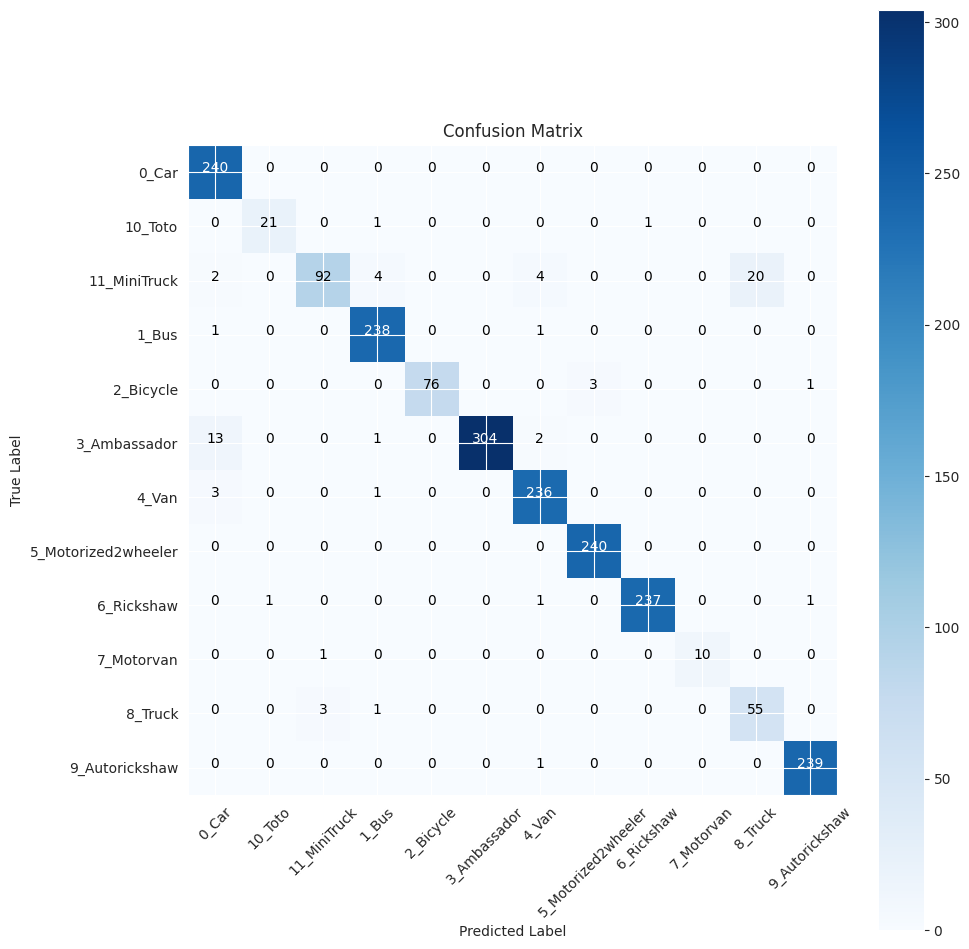

                     precision    recall  f1-score   support

              0_Car       0.93      1.00      0.96       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.96      0.75      0.84       122
              1_Bus       0.97      0.99      0.98       240
          2_Bicycle       1.00      0.95      0.97        80
       3_Ambassador       1.00      0.95      0.97       320
              4_Van       0.96      0.98      0.97       240
5_Motorized2wheeler       0.99      1.00      0.99       240
         6_Rickshaw       1.00      0.99      0.99       240
         7_Motorvan       1.00      0.91      0.95        11
            8_Truck       0.73      0.93      0.82        59
     9_Autorickshaw       0.99      1.00      0.99       240

           accuracy                           0.97      2055
          macro avg       0.96      0.95      0.95      2055
       weighted avg       0.97      0.97      0.97      2055



In [20]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [28]:
import tensorflow as tf
from tensorflow.keras import backend as K

def focal_loss(gamma=2., alpha=0.25):
    """
    Focal Loss for multiclass classification.
    gamma: focusing parameter (higher gamma focuses more on hard misclassified examples)
    alpha: balancing factor (for class imbalance)
    """
    def focal_loss_fixed(y_true, y_pred):
        # Convert labels to float32 for numerical stability
        y_true = tf.cast(y_true, tf.float32)
        
        # Clip prediction values to prevent log(0) errors
        epsilon = K.epsilon()
        y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
        
        # Cross-entropy loss
        cross_entropy = -y_true * K.log(y_pred)
        
        # Focal loss scaling factor
        weight = alpha * K.pow(1 - y_pred, gamma)
        
        # Compute the final loss
        loss = weight * cross_entropy
        return K.sum(loss, axis=-1)
    
    return focal_loss_fixed


In [29]:
# Assuming `img_shape` and `class_count` are already defined
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# Build the model
model = Sequential([
    base_model,
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    Dense(64, kernel_regularizer=regularizers.l2(0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu'),
    Dropout(rate=0.15, seed=123),
    Dense(class_count, activation='softmax')  # Softmax for multiclass classification
])

# Compile the model with the custom focal loss for multiclass classification
# model.compile(
#     optimizer=Adamax(learning_rate=0.001), 
#     loss=focal_loss(gamma=2., alpha=0.25),  # Apply custom focal loss
#     metrics=['accuracy']
# )

model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)
# Model summary
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_1 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 64)                98368     
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [19]:
# Define the ModelCheckpoint callback
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_20_9_24_new__focal_64.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-21 13:33:27.215848: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 1.5616 - accuracy: 0.7957
Epoch 1: val_loss improved from inf to 0.96408, saving model to /kaggle/working/eb3_20_9_24_new__focal_64.h5
218/218 [==============================] - 125s 295ms/step - loss: 1.5616 - accuracy: 0.7957 - val_loss: 0.9641 - val_accuracy: 0.9427
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 0.6790 - accuracy: 0.9400
Epoch 2: val_loss improved from 0.96408 to 0.44021, saving model to /kaggle/working/eb3_20_9_24_new__focal_64.h5
218/218 [==============================] - 62s 284ms/step - loss: 0.6790 - accuracy: 0.9400 - val_loss: 0.4402 - val_accuracy: 0.9667
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 0.3183 - accuracy: 0.9733
Epoch 3: val_loss improved from 0.44021 to 0.21101, saving model to /kaggle/working/eb3_20_9_24_new__focal_64.h5
218/218 [==============================] - 62s 283ms/step - loss: 0.3183 - accuracy: 0.9733 - val_loss: 0.2110 - val_ac

In [20]:
model.load_weights("/kaggle/working/eb3_20_9_24_new__focal_64.h5")
# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_1 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 64)                98368     
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [21]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 78ms/step - loss: 0.4022 - accuracy: 0.9504
--------------------
Validation Loss:  0.3101140558719635
Validation Accuracy:  0.9885321259498596
--------------------
Test Loss:  0.4022309184074402
Test Accuracy:  0.9503649473190308


In [30]:
# Assuming `img_shape` and `class_count` are already defined
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# Build the model
model = Sequential([
    base_model,
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    Dense(128, kernel_regularizer=regularizers.l2(0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu'),
    Dropout(rate=0.15, seed=123),
    Dense(class_count, activation='softmax')  # Softmax for multiclass classification
])

# Compile the model with the custom focal loss for multiclass classification
# model.compile(
#     optimizer=Adamax(learning_rate=0.001), 
#     loss=focal_loss(gamma=2., alpha=0.25),  # Apply custom focal loss
#     metrics=['accuracy']
# )

model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)
# Model summary
model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_2 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_4 (Dense)             (None, 128)               196736    
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 12)                1548      
                                                                 
Total params: 10987963 (41.92 MB)
Trainable params: 10

In [43]:
# Define the ModelCheckpoint callback
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_20_9_24_new.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-20 18:55:11.073007: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_7/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 2.4803 - accuracy: 0.8164
Epoch 1: val_loss improved from inf to 1.29931, saving model to /kaggle/working/eb3_20_9_24_new.h5
218/218 [==============================] - 118s 294ms/step - loss: 2.4803 - accuracy: 0.8164 - val_loss: 1.2993 - val_accuracy: 0.9392
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 0.8042 - accuracy: 0.9458
Epoch 2: val_loss improved from 1.29931 to 0.45215, saving model to /kaggle/working/eb3_20_9_24_new.h5
218/218 [==============================] - 64s 294ms/step - loss: 0.8042 - accuracy: 0.9458 - val_loss: 0.4521 - val_accuracy: 0.9679
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 0.3091 - accuracy: 0.9704
Epoch 3: val_loss improved from 0.45215 to 0.19432, saving model to /kaggle/working/eb3_20_9_24_new.h5
218/218 [==============================] - 62s 284ms/step - loss: 0.3091 - accuracy: 0.9704 - val_loss: 0.1943 - val_accuracy: 0.9828
Epoch 4/40
218/

In [31]:
model.load_weights("/kaggle/working/eb3_20_9_24_new.h5")
model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 83ms/step - loss: 0.0380 - accuracy: 0.9713
--------------------
Validation Loss:  0.026066606864333153
Validation Accuracy:  0.997706413269043
--------------------
Test Loss:  0.037968553602695465
Test Accuracy:  0.9712895154953003


In [23]:
model.load_weights("/kaggle/working/eb3_20_9_24_new.h5")
model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 79ms/step - loss: 0.0380 - accuracy: 0.9713
--------------------
Validation Loss:  0.02576468698680401
Validation Accuracy:  0.9965596199035645
--------------------
Test Loss:  0.037968553602695465
Test Accuracy:  0.9712895154953003


In [32]:
best_model_path='/kaggle/working/eb3_20_9_24_new.h5'
best_model_size = os.path.getsize(best_model_path)


# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)


# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
# For original model
print(f"Number of parameters in the best model: {model.count_params()}")

import os

# Define the paths for both the best_model and pruned_model
best_model_path = '/kaggle/working/eb3_20_9_24_new.h5'  # Path to your original best model
pruned_model_path = '/kaggle/working/eb3_pruned_final_20_9_24_new.h5'  # Pruned model path from your script

# Get the size of both models in bytes
best_model_size = os.path.getsize(best_model_path)
pruned_model_size = os.path.getsize(pruned_model_path)

# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)
pruned_model_size_mb = pruned_model_size / (1024 * 1024)

# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
print(f"Size of the pruned model: {pruned_model_size_mb:.2f} MB")


Size of the best model: 126.42 MB


In [34]:
# For original model
print(f"Number of parameters in the best model: {model.count_params()}")

# # For pruned model (after stripping the pruning wrappers)
# print(f"Number of parameters in the pruned model: {final_pruned_model.count_params()}")


Number of parameters in the best model: 10987963


NameError: name 'final_pruned_model' is not defined

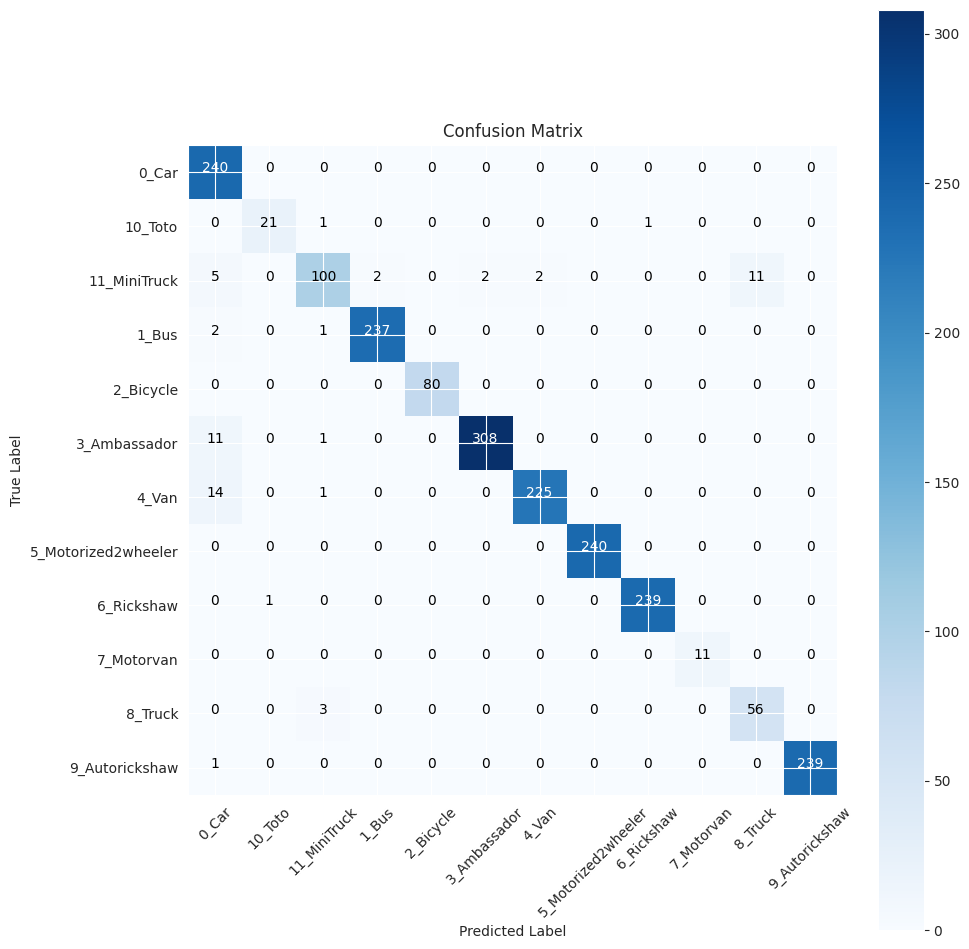

                     precision    recall  f1-score   support

              0_Car       0.88      1.00      0.94       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.93      0.82      0.87       122
              1_Bus       0.99      0.99      0.99       240
          2_Bicycle       1.00      1.00      1.00        80
       3_Ambassador       0.99      0.96      0.98       320
              4_Van       0.99      0.94      0.96       240
5_Motorized2wheeler       1.00      1.00      1.00       240
         6_Rickshaw       1.00      1.00      1.00       240
         7_Motorvan       1.00      1.00      1.00        11
            8_Truck       0.84      0.95      0.89        59
     9_Autorickshaw       1.00      1.00      1.00       240

           accuracy                           0.97      2055
          macro avg       0.96      0.96      0.96      2055
       weighted avg       0.97      0.97      0.97      2055



In [24]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [38]:
model.load_weights("/kaggle/working/eb3_20_9_24_new.h5")
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 78ms/step - loss: 0.0521 - accuracy: 0.9601
--------------------
Validation Loss:  0.029338330030441284
Validation Accuracy:  0.997706413269043
--------------------
Test Loss:  0.052061691880226135
Test Accuracy:  0.9600973129272461


In [29]:
!pip install tensorflow-model-optimization


  Obtaining dependency information for tensorflow-model-optimization from https://files.pythonhosted.org/packages/5a/a0/f38c9ce977285d3f347f6d64cf227924fe9fc97d780d6df4a55563e311af/tensorflow_model_optimization-0.8.0-py2.py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 6.2 MB/s eta 0:00:00a 0:00:01


In [24]:
import tensorflow_model_optimization as tfmot
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint
import os

# Pruning configuration
pruning_params = {
    'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(
        initial_sparsity=0.30,  # Start pruning after 30% sparsity
        final_sparsity=0.80,    # End pruning at 80% sparsity
        begin_step=0,           # Start pruning at step 0
        end_step=2000           # End pruning after this many steps
    )
}

# Load the best pre-trained model from the checkpoint

# _shape` and `class_count` are already defined
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape, pooling='max')

# Build the model
best_model = Sequential([
    base_model,
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    Dense(128, kernel_regularizer=regularizers.l2(0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu'),
    Dropout(rate=0.15, seed=123),
    Dense(class_count, activation='softmax')  # Softmax for multiclass classification
])

# Compile the model with the custom focal loss for multiclass classification
# model.compile(
#     optimizer=Adamax(learning_rate=0.001), 
#     loss=focal_loss(gamma=2., alpha=0.25),  # Apply custom focal loss
#     metrics=['accuracy']
# )
# best_model = '/kaggle/working/eb3_20_9_24_new.h5'
best_model.load_weights("/kaggle/working/eb3_20_9_24_new.h5")
best_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)


43941136/43941136 [==============================] - 3s 0us/step


NameError: name 'focal_loss' is not defined

In [36]:
best_model = Sequential([
    base_model,
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    Dense(128, kernel_regularizer=regularizers.l2(0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu'),
    Dropout(rate=0.15, seed=123),
    Dense(class_count, activation='softmax')  # Softmax for multiclass classification
])

# Compile the model with the custom focal loss for multiclass classification
# model.compile(
#     optimizer=Adamax(learning_rate=0.001), 
#     loss=focal_loss(gamma=2., alpha=0.25),  # Apply custom focal loss
#     metrics=['accuracy']
# )
# best_model = '/kaggle/working/eb3_20_9_24_new.h5'
best_model.load_weights("/kaggle/working/eb3_20_9_24_new.h5")
best_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Apply custom focal loss
    metrics=['accuracy']
)


In [37]:
# Apply pruning to the Dense layers of the loaded model
def apply_pruning_to_model(model):
    # Rebuild the model with pruning applied to the dense layers
    pruned_model = Sequential([
        model.layers[0],  # Retain the EfficientNet base model
        BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
        tfmot.sparsity.keras.prune_low_magnitude(Dense(64,  # Reduced for lightweight model
            kernel_regularizer=regularizers.l2(0.016),
            activity_regularizer=regularizers.l1(0.006),
            bias_regularizer=regularizers.l1(0.006), activation='relu'), **pruning_params),
        Dropout(rate=0.25, seed=123),  # Adjusted dropout
        Dense(class_count, activation='softmax')  # Softmax for multiclass classification
    ])
    return pruned_model

# Apply pruning to the loaded model
pruned_model = apply_pruning_to_model(best_model)

In [32]:

# best_model = load_model(best_model_path, custom_objects={'focal_loss': focal_loss})

# Apply pruning to the Dense layers of the loaded model
def apply_pruning_to_model(model):
    # Rebuild the model with pruning applied to the dense layers
    pruned_model = Sequential([
        model.layers[0],  # Retain the EfficientNet base model
        BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
        tfmot.sparsity.keras.prune_low_magnitude(Dense(64,  # Reduced for lightweight model
            kernel_regularizer=regularizers.l2(0.016),
            activity_regularizer=regularizers.l1(0.006),
            bias_regularizer=regularizers.l1(0.006), activation='relu'), **pruning_params),
        Dropout(rate=0.25, seed=123),  # Adjusted dropout
        Dense(class_count, activation='softmax')  # Softmax for multiclass classification
    ])
    return pruned_model

# Apply pruning to the loaded model
pruned_model = apply_pruning_to_model(best_model)

# Compile the pruned model
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)

# Define pruning callback
pruning_callback = tfmot.sparsity.keras.UpdatePruningStep()

# Fine-tune or train the pruned model (you can skip this if not training further)
with tf.device('/GPU:0'):
    pruned_history = pruned_model.fit(
        x=train_gen,
        epochs=10,  # Fine-tune for a few epochs to adjust after pruning
        verbose=1,
        validation_data=valid_gen,
        shuffle=False,
        callbacks=[pruning_callback]
    )

# Strip pruning wrappers for final model export
final_pruned_model = tfmot.sparsity.keras.strip_pruning(pruned_model)

# Save the pruned model
save_dir = '/kaggle/working/'
pruned_model_path = os.path.join(save_dir, 'eb3_pruned_final_20_9_24_new.h5')
final_pruned_model.save(pruned_model_path)
print(f"Pruned model saved at: {pruned_model_path}")


Epoch 1/10


2024-09-21 09:36:10.177930: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_4/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - 120s 288ms/step - loss: 1.1486 - accuracy: 0.9747 - val_loss: 0.5889 - val_accuracy: 0.9989
Epoch 2/10
218/218 [==============================] - 61s 278ms/step - loss: 0.3680 - accuracy: 0.9943 - val_loss: 0.2041 - val_accuracy: 1.0000
Epoch 3/10
218/218 [==============================] - 60s 274ms/step - loss: 0.1308 - accuracy: 0.9974 - val_loss: 0.0730 - val_accuracy: 1.0000
Epoch 4/10
218/218 [==============================] - 61s 278ms/step - loss: 0.0504 - accuracy: 0.9951 - val_loss: 0.0288 - val_accuracy: 1.0000
Epoch 5/10
218/218 [==============================] - 60s 277ms/step - loss: 0.0231 - accuracy: 0.9983 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 6/10
218/218 [==============================] - 61s 278ms/step - loss: 0.0149 - accuracy: 0.9986 - val_loss: 0.0113 - val_accuracy: 0.9989
Epoch 7/10
218/218 [==============================] - 60s 276ms/step - loss: 0.0114 - accuracy: 0.9991 - val_loss: 0.0083 - val_accuracy: 1.

In [26]:
import os

# Define the paths for both the best_model and pruned_model
best_model_path = '/kaggle/working/eb3_20_9_24_new.h5'  # Path to your original best model
pruned_model_path = '/kaggle/working/eb3_pruned_final_20_9_24_new.h5'  # Pruned model path from your script

# Get the size of both models in bytes
best_model_size = os.path.getsize(best_model_path)
pruned_model_size = os.path.getsize(pruned_model_path)

# Convert bytes to kilobytes (KB) or megabytes (MB) for easier comparison
best_model_size_mb = best_model_size / (1024 * 1024)
pruned_model_size_mb = pruned_model_size / (1024 * 1024)

# Print the sizes of both models
print(f"Size of the best model: {best_model_size_mb:.2f} MB")
print(f"Size of the pruned model: {pruned_model_size_mb:.2f} MB")


Size of the best model: 126.42 MB
Size of the pruned model: 42.21 MB


In [42]:
pruned_model_size

44256264

In [35]:
pruned_model_path = '/kaggle/working/eb3_pruned_final_20_9_24_new.h5'
print(f"Number of parameters in the pruned model: {pruned_model_path.count_params()}")

AttributeError: 'str' object has no attribute 'count_params'

In [38]:
pruned_model = load_model(pruned_model_path)

In [45]:
pruned_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_6 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_21 (Dense)            (None, 64)                98368     
                                                                 
 dropout_9 (Dropout)         (None, 64)                0         
                                                                 
 dense_22 (Dense)            (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [46]:
best_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_3 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_6 (Dense)             (None, 128)               196736    
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 12)                1548      
                                                                 
Total params: 10987963 (41.92 MB)
Trainable params: 10

In [43]:
import numpy as np

def calculate_sparsity(model):
    total_params = 0
    zero_params = 0
    for layer in model.layers:
        weights = layer.get_weights()
        if weights:
            for weight_matrix in weights:
                total_params += np.prod(weight_matrix.shape)
                zero_params += np.sum(weight_matrix == 0)

    sparsity_ratio = zero_params / total_params if total_params > 0 else 0
    print(f"Sparsity: {sparsity_ratio * 100:.2f}% of the weights are zero.")

# Check sparsity in the pruned model
calculate_sparsity(pruned_model)


Sparsity: 0.72% of the weights are zero.


In [44]:
import numpy as np

def calculate_sparsity(model):
    total_params = 0
    zero_params = 0
    for layer in model.layers:
        weights = layer.get_weights()
        if weights:
            for weight_matrix in weights:
                total_params += np.prod(weight_matrix.shape)
                zero_params += np.sum(weight_matrix == 0)

    sparsity_ratio = zero_params / total_params if total_params > 0 else 0
    print(f"Sparsity: {sparsity_ratio * 100:.2f}% of the weights are zero.")

# Check sparsity in the pruned model
calculate_sparsity(best_model)

Sparsity: 0.00% of the weights are zero.


In [39]:
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)


In [40]:
s_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = pruned_model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = pruned_model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 79ms/step - loss: 0.1055 - accuracy: 0.9737
--------------------
Validation Loss:  0.09609512984752655
Validation Accuracy:  0.9988532066345215
--------------------
Test Loss:  0.10552474856376648
Test Accuracy:  0.9737226366996765


In [41]:
print(f"Number of parameters in the pruned model: {pruned_model.count_params()}")

Number of parameters in the pruned model: 10888827


In [43]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = pruned_model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = pruned_model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 79ms/step - loss: 0.1055 - accuracy: 0.9737
--------------------
Validation Loss:  0.09521664679050446
Validation Accuracy:  1.0
--------------------
Test Loss:  0.10552475601434708
Test Accuracy:  0.9737226366996765


In [44]:
pruned_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_6 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_21 (Dense)            (None, 64)                98368     
                                                                 
 dropout_9 (Dropout)         (None, 64)                0         
                                                                 
 dense_22 (Dense)            (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

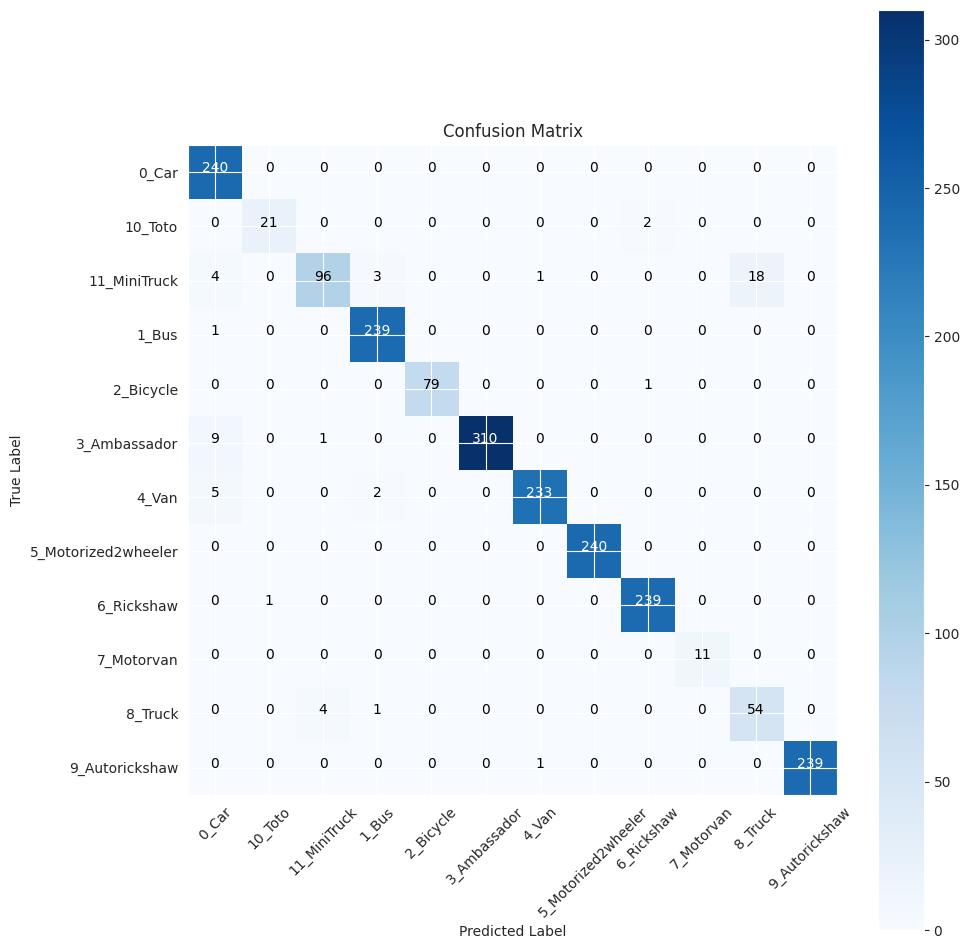

                     precision    recall  f1-score   support

              0_Car       0.93      1.00      0.96       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.95      0.79      0.86       122
              1_Bus       0.98      1.00      0.99       240
          2_Bicycle       1.00      0.99      0.99        80
       3_Ambassador       1.00      0.97      0.98       320
              4_Van       0.99      0.97      0.98       240
5_Motorized2wheeler       1.00      1.00      1.00       240
         6_Rickshaw       0.99      1.00      0.99       240
         7_Motorvan       1.00      1.00      1.00        11
            8_Truck       0.75      0.92      0.82        59
     9_Autorickshaw       1.00      1.00      1.00       240

           accuracy                           0.97      2055
          macro avg       0.96      0.96      0.96      2055
       weighted avg       0.98      0.97      0.97      2055



In [45]:
preds = pruned_model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [47]:

# best_model = load_model(best_model_path, custom_objects={'focal_loss': focal_loss})

# Apply pruning to the Dense layers of the loaded model
def apply_pruning_to_model(model):
    # Rebuild the model with pruning applied to the dense layers
    pruned_model = Sequential([
        model.layers[0],  # Retain the EfficientNet base model
        BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
        tfmot.sparsity.keras.prune_low_magnitude(Dense(64,  # Reduced for lightweight model
            kernel_regularizer=regularizers.l2(0.016),
            activity_regularizer=regularizers.l1(0.006),
            bias_regularizer=regularizers.l1(0.006), activation='relu'), **pruning_params),
        Dropout(rate=0.25, seed=123),  # Adjusted dropout
        Dense(class_count, activation='softmax')  # Softmax for multiclass classification
    ])
    return pruned_model

# Apply pruning to the loaded model
pruned_model = apply_pruning_to_model(best_model)

# Compile the pruned model
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)

# Define pruning callback
pruning_callback = tfmot.sparsity.keras.UpdatePruningStep()

# Fine-tune or train the pruned model (you can skip this if not training further)
with tf.device('/GPU:0'):
    pruned_history = pruned_model.fit(
        x=train_gen,
        epochs=20,  # Fine-tune for a few epochs to adjust after pruning
        verbose=1,
        validation_data=valid_gen,
        shuffle=False,
        callbacks=[pruning_callback]
    )

# Strip pruning wrappers for final model export
final_pruned_model = tfmot.sparsity.keras.strip_pruning(pruned_model)

# Save the pruned model
save_dir = '/kaggle/working/'
pruned_model_path = os.path.join(save_dir, 'eb3_pruned_final_20_9_24_new_2.h5')
final_pruned_model.save(pruned_model_path)
print(f"Pruned model saved at: {pruned_model_path}")


Epoch 1/20


2024-09-21 10:06:35.005273: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_6/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - 120s 292ms/step - loss: 1.1244 - accuracy: 0.9710 - val_loss: 0.5719 - val_accuracy: 0.9954
Epoch 2/20
218/218 [==============================] - 61s 279ms/step - loss: 0.3572 - accuracy: 0.9943 - val_loss: 0.1984 - val_accuracy: 0.9977
Epoch 3/20
218/218 [==============================] - 61s 279ms/step - loss: 0.1261 - accuracy: 0.9980 - val_loss: 0.0704 - val_accuracy: 0.9989
Epoch 4/20
218/218 [==============================] - 61s 279ms/step - loss: 0.0471 - accuracy: 0.9994 - val_loss: 0.0273 - val_accuracy: 0.9989
Epoch 5/20
218/218 [==============================] - 61s 279ms/step - loss: 0.0217 - accuracy: 0.9989 - val_loss: 0.0136 - val_accuracy: 0.9989
Epoch 6/20
218/218 [==============================] - 61s 279ms/step - loss: 0.0136 - accuracy: 0.9986 - val_loss: 0.0100 - val_accuracy: 0.9977
Epoch 7/20
218/218 [==============================] - 61s 278ms/step - loss: 0.0118 - accuracy: 0.9986 - val_loss: 0.0081 - val_accuracy: 1.

In [48]:
pruned_model = load_model(pruned_model_path)
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = pruned_model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = pruned_model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 78ms/step - loss: 0.0963 - accuracy: 0.9679
--------------------
Validation Loss:  0.08139046281576157
Validation Accuracy:  1.0
--------------------
Test Loss:  0.09631169587373734
Test Accuracy:  0.9678832292556763


In [49]:
import numpy as np

def get_model_size(model):
    total_params = np.sum([np.prod(var.shape) for var in model.get_weights()])
    # Assuming each parameter is a float32 (4 bytes)
    return total_params * 4  # Size in bytes

# Size of the original model
original_model_size = get_model_size(best_model)
print(f"Original Model Size: {original_model_size / (1024 ** 2):.2f} MB")

# Size of the final pruned model
final_pruned_model_size = get_model_size(final_pruned_model)
print(f"Final Pruned Model Size: {final_pruned_model_size / (1024 ** 2):.2f} MB")


Original Model Size: 41.92 MB
Final Pruned Model Size: 41.54 MB


In [51]:
best_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_7 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_23 (Dense)            (None, 128)               196736    
                                                                 
 dropout_10 (Dropout)        (None, 128)               0         
                                                                 
 dense_24 (Dense)            (None, 12)                1548      
                                                                 
Total params: 10987963 (41.92 MB)
Trainable params: 10

In [52]:
final_pruned_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_8 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_25 (Dense)            (None, 64)                98368     
                                                                 
 dropout_11 (Dropout)        (None, 64)                0         
                                                                 
 dense_26 (Dense)            (None, 12)                780       
                                                                 
Total params: 10888827 (41.54 MB)
Trainable params: 10

In [53]:

# best_model = load_model(best_model_path, custom_objects={'focal_loss': focal_loss})

# Apply pruning to the Dense layers of the loaded model
def apply_pruning_to_model(model):
    # Rebuild the model with pruning applied to the dense layers
    pruned_model = Sequential([
        model.layers[0],  # Retain the EfficientNet base model
        BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
        tfmot.sparsity.keras.prune_low_magnitude(Dense(32,  # Reduced for lightweight model
            kernel_regularizer=regularizers.l2(0.016),
            activity_regularizer=regularizers.l1(0.006),
            bias_regularizer=regularizers.l1(0.006), activation='relu'), **pruning_params),
        Dropout(rate=0.25, seed=123),  # Adjusted dropout
        Dense(class_count, activation='softmax')  # Softmax for multiclass classification
    ])
    return pruned_model

# Apply pruning to the loaded model
pruned_model = apply_pruning_to_model(best_model)

# Compile the pruned model
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)

# Define pruning callback
pruning_callback = tfmot.sparsity.keras.UpdatePruningStep()

# Fine-tune or train the pruned model (you can skip this if not training further)
with tf.device('/GPU:0'):
    pruned_history = pruned_model.fit(
        x=train_gen,
        epochs=10,  # Fine-tune for a few epochs to adjust after pruning
        verbose=1,
        validation_data=valid_gen,
        shuffle=False,
        callbacks=[pruning_callback]
    )

# Strip pruning wrappers for final model export
final_pruned_model = tfmot.sparsity.keras.strip_pruning(pruned_model)

# Save the pruned model
save_dir = '/kaggle/working/'
pruned_model_path = os.path.join(save_dir, 'eb3_pruned_final_20_9_24_new_32.h5')
final_pruned_model.save(pruned_model_path)
print(f"Pruned model saved at: {pruned_model_path}")


Epoch 1/10


2024-09-21 10:34:21.040082: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_7/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - 120s 301ms/step - loss: 0.6630 - accuracy: 0.9561 - val_loss: 0.3841 - val_accuracy: 0.9989
Epoch 2/10
218/218 [==============================] - 60s 277ms/step - loss: 0.2611 - accuracy: 0.9857 - val_loss: 0.1568 - val_accuracy: 0.9989
Epoch 3/10
218/218 [==============================] - 60s 277ms/step - loss: 0.1086 - accuracy: 0.9931 - val_loss: 0.0646 - val_accuracy: 0.9989
Epoch 4/10
218/218 [==============================] - 61s 279ms/step - loss: 0.0483 - accuracy: 0.9951 - val_loss: 0.0290 - val_accuracy: 0.9977
Epoch 5/10
218/218 [==============================] - 60s 277ms/step - loss: 0.0243 - accuracy: 0.9974 - val_loss: 0.0151 - val_accuracy: 0.9989
Epoch 6/10
218/218 [==============================] - 60s 275ms/step - loss: 0.0165 - accuracy: 0.9983 - val_loss: 0.0107 - val_accuracy: 0.9989
Epoch 7/10
218/218 [==============================] - 60s 276ms/step - loss: 0.0134 - accuracy: 0.9977 - val_loss: 0.0093 - val_accuracy: 0.

In [54]:
pruned_model = load_model(pruned_model_path)
pruned_model.compile(
    optimizer=Adamax(learning_rate=0.001), 
    loss=focal_loss(gamma=4., alpha=0.25),  # Use your custom focal loss function
    metrics=['accuracy']
)
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = pruned_model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = pruned_model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 76ms/step - loss: 0.1061 - accuracy: 0.9659
--------------------
Validation Loss:  0.08923905342817307
Validation Accuracy:  0.997706413269043
--------------------
Test Loss:  0.10613179951906204
Test Accuracy:  0.9659367203712463


In [55]:
pruned_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_9 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_27 (Dense)            (None, 32)                49184     
                                                                 
 dropout_12 (Dropout)        (None, 32)                0         
                                                                 
 dense_28 (Dense)            (None, 12)                396       
                                                                 
Total params: 10839259 (41.35 MB)
Trainable params: 10

In [58]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-16 17:51:03.977240: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_6/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 4.0391 - accuracy: 0.8740
Epoch 1: val_loss improved from inf to 3.08207, saving model to /kaggle/working/eb3_128.h5
218/218 [==============================] - 118s 290ms/step - loss: 4.0391 - accuracy: 0.8740 - val_loss: 3.0821 - val_accuracy: 0.9851
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 2.5908 - accuracy: 0.9782
Epoch 2: val_loss improved from 3.08207 to 2.07681, saving model to /kaggle/working/eb3_128.h5
218/218 [==============================] - 61s 279ms/step - loss: 2.5908 - accuracy: 0.9782 - val_loss: 2.0768 - val_accuracy: 0.9885
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 1.7275 - accuracy: 0.9897
Epoch 3: val_loss improved from 2.07681 to 1.36875, saving model to /kaggle/working/eb3_128.h5
218/218 [==============================] - 61s 281ms/step - loss: 1.7275 - accuracy: 0.9897 - val_loss: 1.3688 - val_accuracy: 0.9874
Epoch 4/40
218/218 [===================

In [59]:
model.load_weights("/kaggle/working/eb3_128.h5")
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 12s 83ms/step - loss: 0.2879 - accuracy: 0.9489
--------------------
Validation Loss:  0.08950643241405487
Validation Accuracy:  0.9954128265380859
--------------------
Test Loss:  0.2878837287425995
Test Accuracy:  0.9489051103591919


In [65]:

base_model = tf.keras.applications.ResNet152(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])


# Define the ModelCheckpoint callback
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_weight_normal_latest.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


234698864/234698864 [==============================] - 1s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152 (Functional)      (None, 2048)              58370944  
                                                                 
 batch_normalization_106 (B  (None, 2048)              8192      
 atchNormalization)                                              
                                                                 
 dense_76 (Dense)            (None, 256)               524544    
                                                                 
 dropout_12 (Dropout)        (None, 256)               0         
                                                                 
 dense_77 (Dense)            (None, 12)                3084      
                                                                 
Total params: 58906764 (224.71 MB)
Trainable params: 

In [87]:

base_model = tf.keras.applications.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])

In [90]:
# Define the ModelCheckpoint callback
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_simple.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 batch_normalization_112 (B  (None, 1536)              6144      
 atchNormalization)                                              
                                                                 
 dense_102 (Dense)           (None, 256)               393472    
                                                                 
 dropout_18 (Dropout)        (None, 256)               0         
                                                                 
 dense_103 (Dense)           (None, 12)                3084      
                                                                 
Total params: 11186235 (42.67 MB)
Trainable params: 11

In [91]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-12 20:34:04.336659: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_3/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 0.2337 - accuracy: 0.9945
Epoch 1: val_loss improved from inf to 0.20059, saving model to /kaggle/working/eb3_simple.h5
218/218 [==============================] - 120s 289ms/step - loss: 0.2337 - accuracy: 0.9945 - val_loss: 0.2006 - val_accuracy: 0.9920
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 0.1880 - accuracy: 0.9968
Epoch 2: val_loss improved from 0.20059 to 0.18676, saving model to /kaggle/working/eb3_simple.h5
218/218 [==============================] - 62s 285ms/step - loss: 0.1880 - accuracy: 0.9968 - val_loss: 0.1868 - val_accuracy: 0.9897
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 0.1612 - accuracy: 0.9994
Epoch 3: val_loss improved from 0.18676 to 0.16309, saving model to /kaggle/working/eb3_simple.h5
218/218 [==============================] - 62s 285ms/step - loss: 0.1612 - accuracy: 0.9994 - val_loss: 0.1631 - val_accuracy: 0.9920
Epoch 4/40
218/218 [==========

In [92]:
model.load_weights("/kaggle/working/eb3_simple.h5")
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 78ms/step - loss: 0.2401 - accuracy: 0.9620
--------------------
Validation Loss:  0.07836467027664185
Validation Accuracy:  0.9942660331726074
--------------------
Test Loss:  0.24009184539318085
Test Accuracy:  0.962043821811676


In [24]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=30,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/30


2024-09-12 14:54:45.660260: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/efficientnetb3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 6.6678 - accuracy: 0.8809
Epoch 1: val_loss improved from inf to 4.95143, saving model to /kaggle/working/eb3_weight_normal.h5
218/218 [==============================] - 125s 303ms/step - loss: 6.6678 - accuracy: 0.8809 - val_loss: 4.9514 - val_accuracy: 0.9794
Epoch 2/30
218/218 [==============================] - ETA: 0s - loss: 3.8103 - accuracy: 0.9776
Epoch 2: val_loss improved from 4.95143 to 2.81796, saving model to /kaggle/working/eb3_weight_normal.h5
218/218 [==============================] - 63s 287ms/step - loss: 3.8103 - accuracy: 0.9776 - val_loss: 2.8180 - val_accuracy: 0.9920
Epoch 3/30
218/218 [==============================] - ETA: 0s - loss: 2.1828 - accuracy: 0.9928
Epoch 3: val_loss improved from 2.81796 to 1.59155, saving model to /kaggle/working/eb3_weight_normal.h5
218/218 [==============================] - 62s 286ms/step - loss: 2.1828 - accuracy: 0.9928 - val_loss: 1.5916 - val_accuracy: 0.9943
Epoch 4/3

In [25]:
model.load_weights("/kaggle/working/eb3_weight_normal.h5")

In [26]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 82ms/step - loss: 0.2972 - accuracy: 0.9567
--------------------
Validation Loss:  0.10001268237829208
Validation Accuracy:  0.9954128265380859
--------------------
Test Loss:  0.2972380220890045
Test Accuracy:  0.9566910266876221


In [27]:
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Multiply, Conv2D, Add, Reshape, Dense, Permute, Activation
from tensorflow.keras import backend as K

# Define the CBAM module
def cbam_block(input_tensor, ratio=8):
    """Contains the implementation of Convolutional Block Attention Module (CBAM).
    As described in CBAM: Convolutional Block Attention Module, with channel and spatial attention mechanisms.
    """
    # Channel attention
    channel = input_tensor.shape[-1]
    avg_pool = GlobalAveragePooling2D()(input_tensor)
    max_pool = GlobalMaxPooling2D()(input_tensor)
    avg_pool = Reshape((1, 1, channel))(avg_pool)
    max_pool = Reshape((1, 1, channel))(max_pool)
    
    shared_dense_one = Dense(channel // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)
    shared_dense_two = Dense(channel, kernel_initializer='he_normal', use_bias=False)
    
    avg_out = shared_dense_one(avg_pool)
    avg_out = shared_dense_two(avg_out)
    max_out = shared_dense_one(max_pool)
    max_out = shared_dense_two(max_out)
    
    channel_attention = Add()([avg_out, max_out])
    channel_attention = Activation('sigmoid')(channel_attention)
    
    # Multiply the input by the channel attention
    x = Multiply()([input_tensor, channel_attention])
    
    # Spatial attention
    avg_pool = K.mean(x, axis=-1, keepdims=True)
    max_pool = K.max(x, axis=-1, keepdims=True)
    spatial_attention = Conv2D(1, (7, 7), strides=1, padding='same', activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(Add()([avg_pool, max_pool]))
    
    # Multiply the input by the spatial attention
    x = Multiply()([x, spatial_attention])
    
    return x


In [28]:
# Load EfficientNetB3 without global pooling
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape)

# Apply CBAM after the base model
x = base_model.output
x = cbam_block(x)  # Adding CBAM module

# Continue with the rest of the model as before
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = GlobalAveragePooling2D()(x)  # Apply global pooling here
x = Dense(256, kernel_regularizer=regularizers.l2(l=0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu')(x)
x = Dropout(rate=0.15, seed=123)(x)
output = Dense(class_count, activation='softmax')(x)

# Compile the final model
model = tf.keras.Model(inputs=base_model.input, outputs=output)





43941136/43941136 [==============================] - 0s 0us/step


In [29]:
# Define the ModelCheckpoint callback
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_CBAM.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 256, 256, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 256, 256, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)     (None, 256, 256, 3)          0         ['normalization[0][0]']   

In [30]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=30,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/30


2024-09-12 16:33:03.200752: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 3.9246 - accuracy: 0.8818
Epoch 1: val_loss improved from inf to 1.73998, saving model to /kaggle/working/eb3_CBAM.h5
218/218 [==============================] - 127s 305ms/step - loss: 3.9246 - accuracy: 0.8818 - val_loss: 1.7400 - val_accuracy: 0.9725
Epoch 2/30
218/218 [==============================] - ETA: 0s - loss: 1.1324 - accuracy: 0.9796
Epoch 2: val_loss improved from 1.73998 to 0.68221, saving model to /kaggle/working/eb3_CBAM.h5
218/218 [==============================] - 63s 288ms/step - loss: 1.1324 - accuracy: 0.9796 - val_loss: 0.6822 - val_accuracy: 0.9885
Epoch 3/30
218/218 [==============================] - ETA: 0s - loss: 0.5303 - accuracy: 0.9905
Epoch 3: val_loss improved from 0.68221 to 0.39893, saving model to /kaggle/working/eb3_CBAM.h5
218/218 [==============================] - 63s 289ms/step - loss: 0.5303 - accuracy: 0.9905 - val_loss: 0.3989 - val_accuracy: 0.9874
Epoch 4/30
218/218 [================

In [31]:
model.load_weights("/kaggle/working/eb3_CBAM.h5")

In [33]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 81ms/step - loss: 0.3116 - accuracy: 0.9518
--------------------
Validation Loss:  0.09149903804063797
Validation Accuracy:  0.9954128265380859
--------------------
Test Loss:  0.3116031885147095
Test Accuracy:  0.9518248438835144


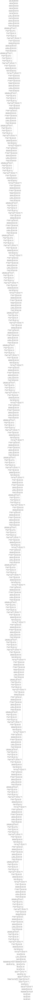

In [32]:
from tensorflow.keras.utils import plot_model
# Save and visualize the model architecture
plot_model(model, to_file='model_architecture_CBAM.png', show_shapes=True, show_layer_names=True)

# Print model summary
# model.summary()

In [82]:
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Multiply, Conv2D, Add, Reshape, Dense, Activation, BatchNormalization, Dropout
from tensorflow.keras import regularizers, backend as K

# Define the CBAM module
def cbam_block(input_tensor, ratio=8):
    """Contains the implementation of Convolutional Block Attention Module (CBAM).
    As described in CBAM: Convolutional Block Attention Module, with channel and spatial attention mechanisms.
    """
    # Channel attention
    channel = input_tensor.shape[-1]
    avg_pool = GlobalAveragePooling2D()(input_tensor)
    max_pool = GlobalMaxPooling2D()(input_tensor)
    avg_pool = Reshape((1, 1, channel))(avg_pool)
    max_pool = Reshape((1, 1, channel))(max_pool)
    
    shared_dense_one = Dense(channel // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)
    shared_dense_two = Dense(channel, kernel_initializer='he_normal', use_bias=False)
    
    avg_out = shared_dense_one(avg_pool)
    avg_out = shared_dense_two(avg_out)
    max_out = shared_dense_one(max_pool)
    max_out = shared_dense_two(max_out)
    
    channel_attention = Add()([avg_out, max_out])
    channel_attention = Activation('sigmoid')(channel_attention)
    
    # Multiply the input by the channel attention
    x = Multiply()([input_tensor, channel_attention])
    
    # Spatial attention
    avg_pool = K.mean(x, axis=-1, keepdims=True)
    max_pool = K.max(x, axis=-1, keepdims=True)
    spatial_attention = Conv2D(1, (7, 7), strides=1, padding='same', activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(Add()([avg_pool, max_pool]))
    
    # Multiply the input by the spatial attention
    x = Multiply()([x, spatial_attention])
    
    return x

# Load EfficientNetB3 without global pooling
base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_shape=img_shape)

# Get the output of the last three layers of the base model
x = base_model.get_layer('block7b_add').output
x = cbam_block(x)  # Adding CBAM after block7b

x = base_model.get_layer('block6d_add').output
x = cbam_block(x)  # Adding CBAM after block6d

# x = base_model.get_layer('block5e_add').output
# x = cbam_block(x)  # Adding CBAM after block5e


# x = base_model.get_layer('block4e_add').output
# x = cbam_block(x)  # Adding CBAM after block5e

# x = base_model.get_layer('block5e_add').output
# x = cbam_block(x)  # Adding CBAM after block5e

# Continue with the rest of the model as before
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = GlobalAveragePooling2D()(x)  # Apply global pooling here
x = Dense(256, kernel_regularizer=regularizers.l2(l=0.016), 
          activity_regularizer=regularizers.l1(0.006), 
          bias_regularizer=regularizers.l1(0.006), activation='relu')(x)
x = Dropout(rate=0.15, seed=123)(x)
output = Dense(class_count, activation='softmax')(x)
# Unfreeze all layers of the base model
base_model.trainable = True

# Compile the final model
model = tf.keras.Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [83]:
# Define the ModelCheckpoint callback
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_CBAM_last2_latest.h5')
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Compile the model
model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_18 (InputLayer)       [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling_28 (Rescaling)    (None, 256, 256, 3)          0         ['input_18[0][0]']            
                                                                                                  
 normalization_14 (Normaliz  (None, 256, 256, 3)          7         ['rescaling_28[0][0]']        
 ation)                                                                                           
                                                                                                  
 rescaling_29 (Rescaling)    (None, 256, 256, 3)          0         ['normalization_14[0][0

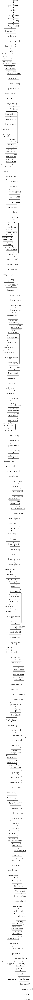

In [77]:
from tensorflow.keras.utils import plot_model
# Save and visualize the model architecture
plot_model(model, to_file='model_architecture_CBAM_between.png', show_shapes=True, show_layer_names=True)

# Print model summary
# model.summary()

In [84]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=40,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )

Epoch 1/40


2024-09-12 19:39:09.646875: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_14/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


218/218 [==============================] - ETA: 0s - loss: 2.9031 - accuracy: 0.8399
Epoch 1: val_loss improved from inf to 1.50040, saving model to /kaggle/working/eb3_CBAM_last2_latest.h5
218/218 [==============================] - 107s 271ms/step - loss: 2.9031 - accuracy: 0.8399 - val_loss: 1.5004 - val_accuracy: 0.9564
Epoch 2/40
218/218 [==============================] - ETA: 0s - loss: 1.1018 - accuracy: 0.9638
Epoch 2: val_loss improved from 1.50040 to 0.73811, saving model to /kaggle/working/eb3_CBAM_last2_latest.h5
218/218 [==============================] - 57s 262ms/step - loss: 1.1018 - accuracy: 0.9638 - val_loss: 0.7381 - val_accuracy: 0.9794
Epoch 3/40
218/218 [==============================] - ETA: 0s - loss: 0.6107 - accuracy: 0.9808
Epoch 3: val_loss improved from 0.73811 to 0.45298, saving model to /kaggle/working/eb3_CBAM_last2_latest.h5
218/218 [==============================] - 57s 260ms/step - loss: 0.6107 - accuracy: 0.9808 - val_loss: 0.4530 - val_accuracy: 0.99

In [86]:
model.load_weights("/kaggle/working/eb3_CBAM_last2_latest.h5")
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 80ms/step - loss: 0.3588 - accuracy: 0.9401
--------------------
Validation Loss:  0.08747929334640503
Validation Accuracy:  0.9931192398071289
--------------------
Test Loss:  0.3588066101074219
Test Accuracy:  0.9401459693908691


In [80]:
model.load_weights("/kaggle/working/eb3_CBAM_last2_latest.h5")
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 76ms/step - loss: 0.2734 - accuracy: 0.9572
--------------------
Validation Loss:  0.08113706856966019
Validation Accuracy:  0.9942660331726074
--------------------
Test Loss:  0.2733589708805084
Test Accuracy:  0.9571776390075684


In [48]:
model.load_weights("/kaggle/working/eb3_CBAM_last3.h5")
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

137/137 [==============================] - 11s 80ms/step - loss: 0.5256 - accuracy: 0.8900
--------------------
Validation Loss:  0.15395742654800415
Validation Accuracy:  0.982798159122467
--------------------
Test Loss:  0.5256185531616211
Test Accuracy:  0.8900243043899536


In [40]:
# Get the total number of layers
num_layers = len(base_model.layers)

# Print the number of layers and their names
print(f"Total number of layers in EfficientNetB3: {num_layers}")

# Print the names of all layers
for i, layer in enumerate(base_model.layers):
    print(f"Layer {i + 1}: {layer.name}")

Total number of layers in EfficientNetB3: 385
Layer 1: input_4
Layer 2: rescaling_6
Layer 3: normalization_3
Layer 4: rescaling_7
Layer 5: stem_conv_pad
Layer 6: stem_conv
Layer 7: stem_bn
Layer 8: stem_activation
Layer 9: block1a_dwconv
Layer 10: block1a_bn
Layer 11: block1a_activation
Layer 12: block1a_se_squeeze
Layer 13: block1a_se_reshape
Layer 14: block1a_se_reduce
Layer 15: block1a_se_expand
Layer 16: block1a_se_excite
Layer 17: block1a_project_conv
Layer 18: block1a_project_bn
Layer 19: block1b_dwconv
Layer 20: block1b_bn
Layer 21: block1b_activation
Layer 22: block1b_se_squeeze
Layer 23: block1b_se_reshape
Layer 24: block1b_se_reduce
Layer 25: block1b_se_expand
Layer 26: block1b_se_excite
Layer 27: block1b_project_conv
Layer 28: block1b_project_bn
Layer 29: block1b_drop
Layer 30: block1b_add
Layer 31: block2a_expand_conv
Layer 32: block2a_expand_bn
Layer 33: block2a_expand_activation
Layer 34: block2a_dwconv_pad
Layer 35: block2a_dwconv
Layer 36: block2a_bn
Layer 37: block2a_a

In [ ]:
model.load_weights("/kaggle/working/eb3_final_selfatt_11_9_no_val.h5")

In [ ]:
# Assuming `train_gen` and `test_gen` are already defined as your training and validation data generators
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=50,
        verbose=1,
        validation_data=valid_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]
    )


In [ ]:
model.load_weights("/kaggle/working/eb3_final_selfatt_11_9_no_val_learning_rate.h5")

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
model.load_weights("/kaggle/working/eb3_final_selfatt_11_9_no_val.h5")

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Multiply, GlobalAveragePooling2D, Input, Add, LayerNormalization, Reshape
# from tensorflow.keras import regularizers, Model
# from tensorflow.keras.layers import MultiHeadAttention

# # Input layer
# input_layer = Input(shape=img_shape)

# # Base model (EfficientNetB3)
# base_model = tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet", input_tensor=input_layer, pooling=None)

# # Global Average Pooling
# x = GlobalAveragePooling2D()(base_model.output)

# # Reshape for Multi-Head Attention (we need a 3D tensor)
# x = Reshape((1, x.shape[1]))(x)

# # Self-Attention mechanism
# attention_output = MultiHeadAttention(num_heads=4, key_dim=x.shape[-1])(x, x)
# attention_output = Add()([x, attention_output])  # Skip connection
# attention_output = LayerNormalization(epsilon=1e-6)(attention_output)

# # Flatten the attention output back to 2D for further processing
# attention_output = tf.keras.layers.Flatten()(attention_output)

# # Further Dense layers with regularization and dropout
# x = Dense(512, activation='relu')(attention_output)
# x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
# x = Dropout(rate=0.15, seed=123)(x)

# x = Dense(256, kernel_regularizer=regularizers.l2(l=0.016), 
#           activity_regularizer=regularizers.l1(0.006),
#           bias_regularizer=regularizers.l1(0.006), activation='relu')(x)
# x = Dropout(rate=0.15, seed=123)(x)

# # Output layer
# output_layer = Dense(class_count, activation='softmax')(x)

# # Model definition
# model = Model(inputs=input_layer, outputs=output_layer)

# # Compile the model
# # model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
from tensorflow.keras.applications import EfficientNetB3, InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, Concatenate
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import ModelCheckpoint
# import os
# import tensorflow as tf

# # Define the EfficientNet base model
# effnet_base = EfficientNetB3(weights='imagenet', include_top=False, input_shape=img_shape)
# effnet_output = effnet_base.output
# effnet_output = GlobalAveragePooling2D()(effnet_output)

# # Define the InceptionV3 base model
# inception_base = InceptionV3(weights='imagenet', include_top=False, input_shape=img_shape)
# inception_output = inception_base.output
# inception_output = GlobalAveragePooling2D()(inception_output)

# # Concatenate the outputs of both models
# combined_output = Concatenate()([effnet_output, inception_output])

# # Add a fully connected layer
# x = BatchNormalization()(combined_output)
# x = Dense(256, kernel_regularizer=regularizers.l2(0.016), activity_regularizer=regularizers.l1(0.006), 
#           bias_regularizer=regularizers.l1(0.006), activation='relu')(x)
# x = Dropout(rate=0.15, seed=123)(x)

# # Final output layer
# output = Dense(class_count, activation='softmax')(x)

# # Create the model
# model = Model(inputs=[effnet_base.input, inception_base.input], outputs=output)

# # Save directory and file path for the model checkpoints
# save_dir = '/kaggle/working/'
# filepath = os.path.join(save_dir, 'effnet_inception_combined_loss.h5')

# # Define the ModelCheckpoint callback to save the best model based on validation loss
# checkpoint_callback = ModelCheckpoint(
#     filepath=filepath,  
#     save_best_only=True,
#     monitor='val_loss',  # Monitor validation loss
#     mode='min',          # Save model with minimum validation loss
#     verbose=1
# )

# # Define the combined loss function (e.g., categorical crossentropy + MSE)
# def combined_loss(y_true, y_pred):
#     loss1 = tf.keras.losses.categorical_crossentropy(y_true, y_pred)
#     loss2 = tf.keras.losses.mean_squared_error(y_true, y_pred)
#     return loss1 + loss2  # Adjust the weight for MSE if needed

# # Compile the model with Adamax optimizer and the combined loss function
# model.compile(optimizer=Adamax(learning_rate=0.0001), 
#               loss=combined_loss, 
#               metrics=['accuracy'])

# # Model summary
# model.summary()



In [ ]:
# with tf.device('/GPU:0'):
#     history = model.fit(
#         x=train_gen,  # Input for both models
#         epochs=epochs,
#         verbose=1,
#         validation_data=(test_gen),  # Validation data for both
#         validation_steps=None,
#         shuffle=False,
#         callbacks=[checkpoint_callback]  # Include the checkpoint callback
#     )

In [ ]:
# import tensorflow as tf
# from tensorflow.keras import layers, regularizers, models

# # Base EfficientNetB6 model
# base_model = tf.keras.applications.EfficientNetB6(include_top=False, weights="imagenet", input_shape=img_shape, pooling=None)

# # Input layer
# inputs = tf.keras.Input(shape=img_shape)

# # Pass the inputs through the base model
# x = base_model(inputs)

# # Add Batch Normalization
# x = layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

# # Add Reshape layer to make the dimensions compatible with MultiHeadAttention
# x = layers.Reshape((-1, x.shape[-1]))(x)  # (batch_size, sequence_length, embedding_dim)

# # Add Multi-Head Attention (self-attention: query = key = value)
# attention_output = layers.MultiHeadAttention(num_heads=4, key_dim=x.shape[-1])(x, x)

# # Add Layer Normalization
# x = layers.LayerNormalization(epsilon=1e-6)(attention_output)

# # Add Global Average Pooling
# x = layers.GlobalAveragePooling1D()(x)

# # Fully connected layers
# x = layers.Dense(256, activation='relu', 
#                  kernel_regularizer=regularizers.l2(0.016),
#                  activity_regularizer=regularizers.l1(0.006),
#                  bias_regularizer=regularizers.l1(0.006))(x)

# # Add Dropout
# x = layers.Dropout(rate=0.15, seed=123)(x)

# # Output layer
# outputs = layers.Dense(class_count, activation='softmax')(x)

# # Create the model
# model = models.Model(inputs, outputs)

# # Compile the model
# # model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])



In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
save_dir = '/kaggle/working/'
filepath = os.path.join(save_dir, 'eb3_final_simple_10_9_no_val.h5')
# Define the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(
    filepath=filepath,  # Filepath where the best weights will be saved
    save_best_only=True,                # Save only the best model based on the validation loss
    monitor='val_loss',                 # Monitor validation loss
    mode='min',                         # The model is saved when validation loss is minimized
    verbose=1                           # Print a message when saving the best model
)

# Compile the model
model.compile(Adamax(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()



In [ ]:
# Train the model with the ModelCheckpoint callback
with tf.device('/GPU:0'):
    history = model.fit(
        x=train_gen,
        epochs=epochs,
        verbose=1,
        validation_data=test_gen,
        validation_steps=None,
        shuffle=False,
        callbacks=[checkpoint_callback]  # Include the checkpoint callback in the training
    )


In [ ]:
model.load_weights("/kaggle/working/eb3_final_selfatt_10_9_no_val.h5")

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
# valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
# print('-' * 20)
# print("Validation Loss: ", valid_score[0])
# print("Validation Accuracy: ", valid_score[1])
# print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
# valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
# print('-' * 20)
# print("Validation Loss: ", valid_score[0])
# print("Validation Accuracy: ", valid_score[1])
# print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
base_model = tf.keras.applications.EfficientNetB3(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])

In [ ]:
with tf.device('/GPU:0'):
    history = model.fit(x= train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen, 
                    validation_steps= None, shuffle= False)

In [ ]:
model.save_weights("/kaggle/working/effb3_train_val_mixed.h5")

In [ ]:
import pandas as pd

# Create a DataFrame from the history dictionary
history_df = pd.DataFrame(history.history)

# Use the DataFrame's 'to_string' method to print the DataFrame in a tabular format
print(history_df.to_string())

In [ ]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

# train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

# print("Train Loss: ", train_score[0])
# print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
test_gen.classes

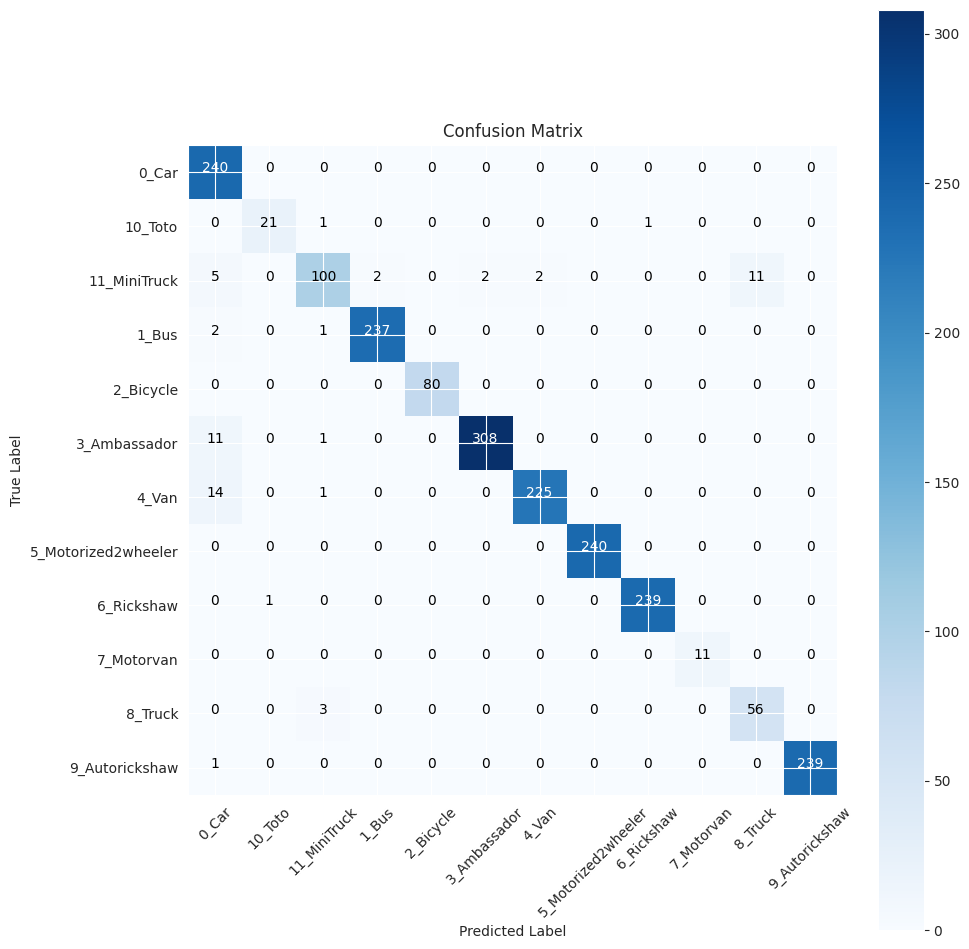

                     precision    recall  f1-score   support

              0_Car       0.88      1.00      0.94       240
            10_Toto       0.95      0.91      0.93        23
       11_MiniTruck       0.93      0.82      0.87       122
              1_Bus       0.99      0.99      0.99       240
          2_Bicycle       1.00      1.00      1.00        80
       3_Ambassador       0.99      0.96      0.98       320
              4_Van       0.99      0.94      0.96       240
5_Motorized2wheeler       1.00      1.00      1.00       240
         6_Rickshaw       1.00      1.00      1.00       240
         7_Motorvan       1.00      1.00      1.00        11
            8_Truck       0.84      0.95      0.89        59
     9_Autorickshaw       1.00      1.00      1.00       240

           accuracy                           0.97      2055
          macro avg       0.96      0.96      0.96      2055
       weighted avg       0.97      0.97      0.97      2055



In [21]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [ ]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [ ]:

# Define a function to get predictions for all images in test_gen
def get_predictions(generator, model, filenames):
    all_predictions = []
    all_filepaths = []
    
    for i, (images, _) in enumerate(generator):
        preds = model.predict(images, verbose=0)
        all_predictions.extend(preds)
        batch_filepaths = filenames[i * generator.batch_size:(i + 1) * generator.batch_size]
        all_filepaths.extend(batch_filepaths)
        print(images)
        break
        
        if len(all_filepaths) >= generator.samples:
            break
    
    return np.array(all_predictions), all_filepaths

# Get filepaths from the test DataFrame
test_filepaths = ts_df['filepaths'].tolist()

# Get predictions
predictions, filepaths = get_predictions(test_gen, model, test_filepaths)

In [ ]:
base_model = tf.keras.applications.MobileNetV3Large(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model.summary()

In [ ]:
with tf.device('/GPU:0'):
    history = model.fit(x= train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen, 
                    validation_steps= None, shuffle= False)

In [ ]:
import pandas as pd

# Create a DataFrame from the history dictionary
history_df = pd.DataFrame(history.history)

# Use the DataFrame's 'to_string' method to print the DataFrame in a tabular format
print(history_df.to_string())

In [ ]:
model.save_weights("/kaggle/working/mvnet_stanfrd.h5")

In [ ]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [ ]:
ts_length = len(ts_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [ ]:
ts_df

In [ ]:
ts_df['filepaths'][0]

In [ ]:
class_labels

In [ ]:
predicted_labels[0]

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Get the class indices and labels
class_indices = train_gen.class_indices
class_labels = list(class_indices.keys())

# Initialize lists to store true labels and predicted labels
true_labels = []
predicted_labels = []
d=[]
# Iterate through each image in the test dataframe
for i in range(len(ts_df)):
    # Load and preprocess the image
    img_path = ts_df.iloc[i]['filepaths']
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    
    # Predict the probabilities for the image
    prediction = model.predict(img_array)
    prediction = prediction[0]  # Get the prediction for this single image
    
    # Get the true class label from the DataFrame
    true_class_label = ts_df.iloc[i]['labels']
    
    # Get the final predicted class
    final_class_index = prediction.argmax()
    final_class_label = class_labels[final_class_index]
    
    # Append true and predicted labels to the lists
    true_labels.append(true_class_label)
    predicted_labels.append(final_class_label)
    d.append([img_path,true_class_label,final_class_label])

# Calculate the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels, labels=class_labels)

# # Plot the confusion matrix
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
# plt.xlabel('Predicted Label')
# plt.ylabel('True Label')
# plt.title('Confusion Matrix')
# plt.show()

# Print classification report
print(classification_report(true_labels, predicted_labels, target_names=class_labels))


In [ ]:
import numpy as np
import pandas as pd

# Define a function to get predictions, true labels, and file paths from the generator
def get_predictions_and_labels(generator, model, true_labels):
    all_predictions = []
    all_filepaths = []
    all_true_labels = []
    
    for i in range(len(generator)):
        images, labels = next(generator)  # Get the next batch of images and labels
        preds = model.predict(images, verbose=0)
        batch_filepaths = generator.filenames[i * generator.batch_size:(i + 1) * generator.batch_size]
        batch_true_labels = true_labels[i * generator.batch_size:(i + 1) * generator.batch_size]
        
        all_predictions.extend(preds)
        all_filepaths.extend(batch_filepaths)
        all_true_labels.extend(batch_true_labels)
        
        if len(all_filepaths) >= generator.samples:
            break
    
    return np.array(all_predictions), all_true_labels, all_filepaths

# Get true labels from the test DataFrame
test_true_labels = ts_df['labels'].tolist()  # Ensure this matches the format used in the generator

# Ensure generator is configured without shuffling
test_gen = ts_gen.flow_from_dataframe(ts_df, x_col='filepaths', y_col='labels', target_size=img_size,
                                       class_mode='categorical', color_mode='rgb', shuffle=False, batch_size=batch_size)

# Get predictions, true labels, and file paths
predictions, true_labels, filepaths = get_predictions_and_labels(test_gen, model, test_true_labels)

# Convert predictions and true labels to class labels
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(true_labels, axis=1)

# Create a DataFrame with results
results_df = pd.DataFrame({
    'filepaths': filepaths,
    'true_labels': [classes[c] for c in true_classes],
    'predicted_labels': [classes[c] for c in predicted_classes],
    'predicted_probabilities': [list(pred) for pred in predictions]  # List of probabilities for each class
})

# Print the results
print(results_df.head())

# Save the results to a CSV file if needed
results_df.to_csv('test_results.csv', index=False)


In [ ]:
true_labels[0]

In [ ]:
class_labels

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels, labels=class_labels)

In [ ]:
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print(report)

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
label_encoder = LabelEncoder()


label_encoder.fit(class_labels)

# Encode labels
true_labels_encoded = label_encoder.transform(true_labels)
predicted_labels_encoded = label_encoder.transform(predicted_labels)

# Get class names
class_names = label_encoder.classes_
report = classification_report(true_labels_encoded, predicted_labels_encoded, target_names=class_names)
print(report)

In [ ]:
correct_predictions = sum(t == p for t, p in zip(true_labels, predicted_labels))

# Output the number of correct predictions
print(f"Number of correct predictions: {correct_predictions}")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing import image

# Get the class indices and labels
class_indices = train_gen.class_indices
class_labels = list(class_indices.keys())

# Iterate through each image in the test dataframe
for i in range(len(ts_df)):
    # Load and preprocess the image
    img_path = ts_df.iloc[i]['filepaths']
#     print(img_path)
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    
    # Predict the probabilities for the image
    prediction = model.predict(img_array)
    prediction = prediction[0]  # Get the prediction for this single image
    
    # Get the true class label from the DataFrame
    true_class_label = ts_df.iloc[i]['labels']
    
    # Get the final predicted class
    final_class_index = prediction.argmax()
    final_class_label = class_labels[final_class_index]
    
    # Check if the prediction is correct
    if final_class_label == true_class_label:
        # Display the image
        print(img_path)
        plt.imshow(image.img_to_array(img) / 255.0)
        plt.axis('off')
        plt.show()
        
        # Print the probability for the correct class
        print(f"True Class: {true_class_label}")
        print(f"Probability of {true_class_label}: {prediction[final_class_index]:.4f}")
        print(f"Final Predicted Class: {final_class_label} with probability {prediction[final_class_index]:.4f}\n")
        break


In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# from tensorflow.keras.preprocessing import image

# # Generate predictions
# predictions = model.predict(test_gen, verbose=1)

# # Get the class indices
# class_indices = train_gen.class_indices
# class_labels = list(class_indices.keys())

# Iterate through the predictions and display the image along with the probabilities and true class
for i, prediction in enumerate(predictions):
    # Load the image
    img_path = ts_df.iloc[i]['filepaths']
    print(img_path)
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    
    # Display the image
    plt.imshow(img_array)
    plt.axis('off')
    plt.show()
    
    # Get the true class label
    true_class_index = np.argmax(ts_df.iloc[i]['labels'])
    true_class_label = class_labels[true_class_index]
    
    # Print the probability for each class
    print(f"True Class: {true_class_label}")
    for j, class_label in enumerate(class_labels):
        print(f"Probability of {class_label}: {prediction[j]:.4f}")
    
    # Get the final predicted class
    final_class_index = prediction.argmax()
    final_class_label = class_labels[final_class_index]
    final_probability = prediction[final_class_index]
    
    print(f"Final Predicted Class: {final_class_label} with probability {final_probability:.4f}\n")
    break


In [ ]:
base_model = tf.keras.applications.(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')

model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.15, seed= 123),
    Dense(class_count, activation= 'softmax')
])

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model.summary()

In [ ]:
with tf.device('/GPU:0'):
    history = model.fit(x= train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen, 
                    validation_steps= None, shuffle= False)

In [ ]:
import pandas as pd

# Create a DataFrame from the history dictionary
history_df = pd.DataFrame(history.history)

# Use the DataFrame's 'to_string' method to print the DataFrame in a tabular format
print(history_df.to_string())

In [ ]:
!pip install pydot graphviz

# Import necessary modules
from tensorflow.keras import models
from tensorflow.keras.utils import plot_model
from IPython.display import Image

model_visual = models.Model(inputs=model.input, outputs=model.output)

# Save model architecture to a file
plot_model(model_visual, show_dtype=True, to_file='efficientnetb3_model_architecture.png', show_shapes=True)

# Display model architecture in the notebook
Image(retina=True, filename='efficientnetb3_model_architecture.png')

In [ ]:
!pip install visualkeras

In [ ]:
from visualkeras import layered_view
# Visualize the model
layered_view(model, legend=True, max_xy=600)

In [ ]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [ ]:
ts_length = len(ts_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [ ]:
history = model.fit(x= train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen, 
                    validation_steps= None, shuffle= False)

In [ ]:
import pandas as pd

# Create a DataFrame from the history dictionary
history_df = pd.DataFrame(history.history)

# Use the DataFrame's 'to_string' method to print the DataFrame in a tabular format
print(history_df.to_string())

In [ ]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [ ]:
ts_length = len(ts_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [ ]:
model.save_weights("/kaggle/working/EfficientNetB3_ju_vehicle.h5")

In [ ]:
ts_length = len(ts_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

In [ ]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

print(classification_report(test_gen.classes, y_pred, target_names= classes))

In [ ]:

import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D
import os
import pandas as pd
import numpy as np

# Load the EfficientNetB3 model
base_model_efnetb3 = EfficientNetB3(include_top=False, input_shape=(224, 224, 3))
base_model_efnetb3.load_weights('/kaggle/working/EfficientNetB3_BrainTumor_Crystal_Weights.h5', by_name=True)

x = base_model_efnetb3.output
x = GlobalAveragePooling2D()(x)
feature_extraction_model = Model(inputs=base_model_efnetb3.input, outputs=x)

labels = {'glioma_tumor':1,'no_tumor':0,'meningioma_tumor':2,'pituitary_tumor':3}
training_global_average_pool_2d_efnetb3 = []
testing_global_average_pool_2d_efnetb3 = []


In [ ]:
main_folder = '/kaggle/working/crystal/train'
total_files=1
subfiles=1
# Iterate through subfolders and print subfolder name and file names
for root, dirs, files in os.walk(main_folder):
  print(total_files)
  for file in files:
    if file.endswith(('jpg', 'jpeg', 'png')):
      d=[]
      file_path = os.path.join(root, file)  # Check for image file formats
      img = image.load_img(file_path, target_size=(224, 224))
      img_array = image.img_to_array(img)
      img_array = np.expand_dims(img_array, axis=0)
      processed_img = preprocess_input(img_array)
      global_average_features = feature_extraction_model.predict(processed_img)
      one_dim_list = np.array(global_average_features).flatten()
      sub_folder_name=os.path.basename(root)
      ch=labels[sub_folder_name]
      d.append(sub_folder_name+'_'+file)
      d.extend(one_dim_list)
      d.append(ch)
      training_global_average_pool_2d_efnetb3.append(d)
      subfiles+=1
      total_files+=1

In [ ]:
training_df=pd.DataFrame(training_global_average_pool_2d_efnetb3)

In [ ]:
training_df

In [ ]:
main_folder = '/kaggle/working/crystal/test'
total_files=1
subfiles=1
# Iterate through subfolders and print subfolder name and file names
for root, dirs, files in os.walk(main_folder):
  print(total_files)
  for file in files:
    if file.endswith(('jpg', 'jpeg', 'png')):
      d=[]
      file_path = os.path.join(root, file)  # Check for image file formats
      img = image.load_img(file_path, target_size=(224, 224))
      img_array = image.img_to_array(img)
      img_array = np.expand_dims(img_array, axis=0)
      processed_img = preprocess_input(img_array)
      global_average_features = feature_extraction_model.predict(processed_img)
      one_dim_list = np.array(global_average_features).flatten()
      sub_folder_name=os.path.basename(root)
      ch=labels[sub_folder_name]
      d.append(sub_folder_name+'_'+file)
      d.extend(one_dim_list)
      d.append(ch)
      testing_global_average_pool_2d_efnetb3.append(d)
      subfiles+=1
      total_files+=1

In [ ]:
testing_df=pd.DataFrame(testing_global_average_pool_2d_efnetb3)

In [ ]:
testing_df

In [ ]:
# Save Testing DataFrame to a CSV file
testing_df.to_csv('/kaggle/working/testing_global_average_pool_2d_efnetb3_trained_weights_new.csv', index=False)

# Save Training DataFrame to a CSV file
training_df.to_csv('/kaggle/working/training_global_average_pool_2d_efnetb3_trained_weights_new.csv', index=False)

Number of Reduced Features VS. Accuracy of SVM (Polynomial) Classifier

In [ ]:
import pandas as pd
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score,f1_score,recall_score,cohen_kappa_score,precision_score
import seaborn as sns
import matplotlib.pyplot as plt

# Load the training dataset
df = pd.read_csv('/kaggle/working/training_global_average_pool_2d_efnetb3_trained_weights_new.csv')

# Separate features and target
X_train = df.iloc[:, 1:-1]
y_train = df.iloc[:, -1]

# Initialize the MinMaxScaler and apply it
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)

# Initialize the SVM Classifier
clf = SVC(kernel='poly', gamma = 0.5, C = 0.1, random_state=7)

# Load the unseen testing dataset
df_test = pd.read_csv('/kaggle/working/testing_global_average_pool_2d_efnetb3_trained_weights_new.csv')

X_test = df_test.iloc[:, 1:-1]
y_test = df_test.iloc[:, -1]

X_test = scaler.transform(X_test)

# Define the range of k
k_values = range(1000, 1501, 50)

# Initialize a list to store accuracy for each k
accuracy_list = []

for k in k_values:
    # Apply Mutual Information for feature selection
    selector = SelectKBest(mutual_info_classif, k=k)
    X_train_k = selector.fit_transform(X_train, y_train)
    X_test_k = selector.transform(X_test)

    # Train the model
    clf.fit(X_train_k, y_train)

    # Predict the labels of the test set
    y_pred = clf.predict(X_test_k)

    # Calculate accuracy and append to the list
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)

# Plot the accuracy graph
plt.figure(figsize=(10, 6))
plt.plot(k_values, accuracy_list, marker='o', linestyle='-')
plt.title('Accuracy vs. Number of Features')
plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.grid()
plt.show()

In [ ]:
import pandas as pd
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score,f1_score,recall_score,cohen_kappa_score,precision_score
import seaborn as sns
import matplotlib.pyplot as plt

# Load the training dataset
df = pd.read_csv('/kaggle/working/training_global_average_pool_2d_efnetb3_trained_weights_new.csv')

# Separate features and target
X_train = df.iloc[:, 1:-1]
y_train = df.iloc[:, -1]

# Initialize the MinMaxScaler and apply it
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)

# Initialize the SVM Classifier
clf = SVC(kernel='poly', gamma = 0.5, C = 0.1, random_state=7)

# Train the model
clf.fit(X_train, y_train)

# Load the unseen testing dataset
df_test = pd.read_csv('/kaggle/working/testing_global_average_pool_2d_efnetb3_trained_weights_new.csv')

X_test = df_test.iloc[:, 1:-1]
y_test = df_test.iloc[:, -1]

X_test = scaler.transform(X_test)

# Predict the labels of the test set
y_pred = clf.predict(X_test)

# Print the classification report
print("SVM (Polynomial) \n")
print(classification_report(y_test, y_pred))

# print('\n------------------ Confusion Matrix -----------------\n')

print("Confusion Matrix \n")
cm2 = confusion_matrix(y_test, y_pred)
sns.heatmap(cm2, annot=True, fmt='d', cmap='Blues')
plt.show()

print('\nAccuracy SVM (Polynomial): {:.2f} %'.format(accuracy_score(y_test,y_pred)*100))
